# 5. 지도학습 : 회귀

- 지도학습 : 회귀 + 분류 : 훈련 데이터(Training Data)로부터 하나의 함수를 유추해내기 위한 방법

    - 회귀 : 입력에 대해 연속적인 값을 대응시키는 문제
    
    - 분류 : 입력에 대해 순서가 없는 클라스(라벨)를 대응시키는 문제

## 5.1 1차원 입력 직선 모델

### 5.1.0. 예시


- 나이 $x$와 키 $t$가 세트로 된 데이터 : 16인분의 데이터 가지고 있다.<br> 

![스크린샷 2024-07-08 15.19.54.png](<attachment:스크린샷 2024-07-08 15.19.54.png>)
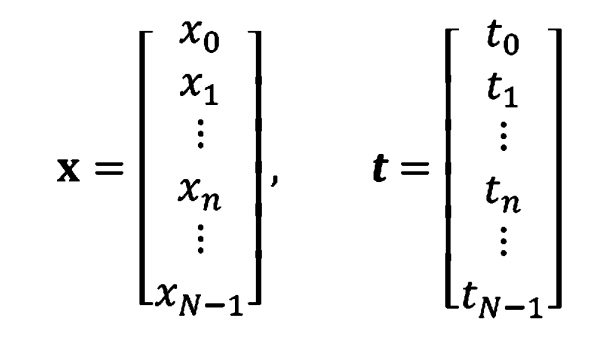

- $x_n$ : 입력 변수 

- $t_n$ : 목표 변수(대상)

- $n$ : 각 개인을 나타내는 데이터의 인덱스

---

- $x$ : 입력 데이터(모든 데이터를 정리)

- $t$ : 목표 데이터(모든 데이터를 정리)

- 목적 : 데이터베이스에 없는 사람의 나이에 대해 그 사람의 키 $t$ 예측

In [2]:
# List 5-1-1
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# 데이터 생성 ---
np.random.seed(seed=1) # 난수 고정
X_min = 4 # X의 하한(표시용)
X_max = 30 # X의 상한(표시용)
X_n = 16 # X의 상한(표시용)
X = 5 + 25 * np.random.rand(X_n)
Prm_c = [170, 108, 0.2] # 생성 매개 변수
T = Prm_c[0] - Prm_c[1] * np.exp(-Prm_c[2] * X) \
+ 4 * np.random.randn(X_n) # (A)
np.savez('ch5_data.npz', X=X, X_min=X_min, X_max=X_max, X_n=X_n, T=T) # (B)

# List 5-1-2
print(X)

[15.42555012 23.00811234  5.00285937 12.55831432  8.66889727  7.30846487
  9.65650528 13.63901818 14.91918686 18.47041835 15.47986286 22.13048751
 10.11130624 26.95293591  5.68468983 21.76168775]


List 5-1-1 

- 16명의 나이 $x$를 임의로 결정

- (A) : X에서 T를 결정

- \ : 한 줄을 내릴 때 사용하는 기호

- (B) : 생성한 data를 'ch5_data.npz'에 저장

In [3]:
# List 5-1-3
print(np.round(X, 2))       # np.round : 소수점 이하의 표시가 너무 길다면, 반올림하는 "np.round" 함수 사용 하여 깔끔하게 표시 가능

[15.43 23.01  5.   12.56  8.67  7.31  9.66 13.64 14.92 18.47 15.48 22.13
 10.11 26.95  5.68 21.76]


In [4]:
# List 5-1-4
print(np.round(T, 2))       #  np.round의 두 번째 인수 2는 소수점 이하 몇자리를 나타낼지 지정

[170.91 160.68 129.   159.7  155.46 140.56 153.65 159.43 164.7  169.65
 160.71 173.29 159.31 171.52 138.96 165.87]


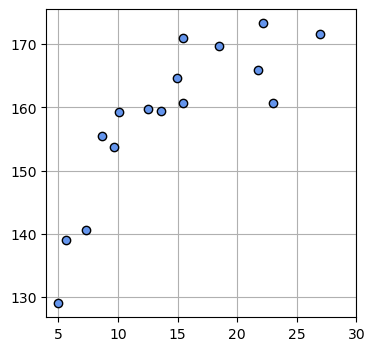

In [7]:
# List 5-1-5 : X와 T를 그래프로 표시

# 데이터 그래프 ---
plt.figure(figsize=(4, 4))
plt.plot(X, T, marker='o', linestyle='None', markeredgecolor='black', color='cornflowerblue')
plt.xlim(X_min, X_max)
plt.grid(True)
plt.show()

### 5.1.1. 직선 모델

- 데이터가 고르지 않기 때문에, 새로운 나이 데이터에 키를 정확히 맞추기 어려움

- 오차를 어느정도 허용한다면 주어진 데이터에서 직선을 긋는 것으로 어느정도 예측 가능

$$y(x) = w_ox+w_1$$

- 기울기 : $w_0$ / 절편 : $w_1$ $\rightarrow$ 다양한 위치와 기울기의 직선을 만들 수 있다.

- 입력 $x$에 $y(x)$를 출력하는 함수 이므로, $y(x)$ : $x$에 대한 $t$의 예측치로 간주 

### 5.1.2. 제곱 오차 함수

- 데이터에 부합하도록 오차 $J$ 정의

- $J$ : 평균 제곱 오차(Mean Square Error, MSE) : 직선과 데이터 점의 차의 제곱의 평균 / 오차의 크기가 N에 의존하지 않음

$$ J = {1 \over N } \displaystyle\sum_{n=0}^{N-1} {(y_n - t_n)^2} $$

- $y_n$ : 직선 모델에 $x_n$을 넣었을 때의 출력

$$ y_n = y(x_n) = w_0 x_n + w_1$$

![스크린샷 2024-07-08 15.46.09.png](<attachment:스크린샷 2024-07-08 15.46.09.png>)

- $w_0$, $w_1$을 결정하면 평균 제곱 오차 $J$ 계산 가능

- 어떤 $w_0$, $w_1$를 선택하더라도, 데이터가 직선 상에 있지 않기에 $J \neq 0$
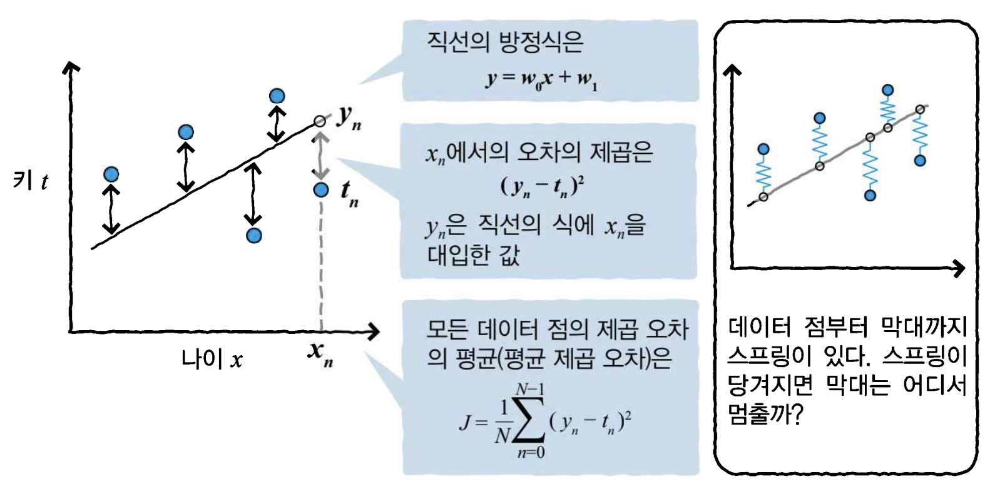

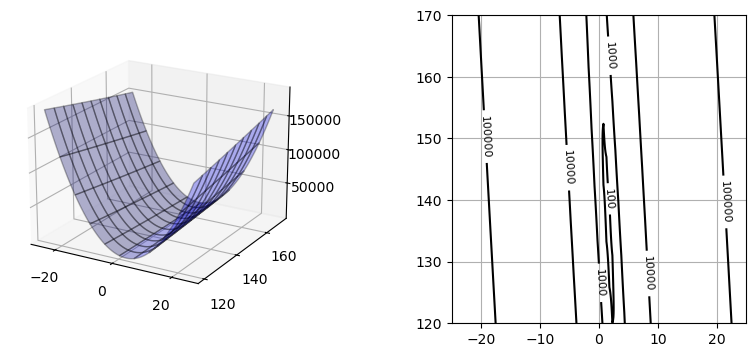

In [13]:
# List 5-1-6 : w, J의 관계를 그래프로 표현 > 특정 범위 내의 w0과 w1의 그리드에서 J값을 계산하여 플롯(데이터를 그래프나 도형으로 시각화 함)
from mpl_toolkits.mplot3d import Axes3D

# 평균 오차 함수 ---
def mse_line(x, t, w):
    y = w[0] * x + w[1]
    mse = np.mean((y-t)**2)
    return mse 

# 계산 ---
xn = 100        # 등고선 표시 해상도
w0_range = [-25, 25]
w1_range = [120, 170]
x0 = np.linspace(w0_range[0], w0_range[1], xn)
x1 = np.linspace(w1_range[0], w1_range[1], xn)
xx0, xx1 = np.meshgrid(x0, x1)
J = np.zeros((len(x0), len(x1)))

for i0 in range(xn):
    for i1 in range(xn):
        J[i1, i0] = mse_line(X, T, (x0[i0], x1[i1]))

# 표시 ---
plt.figure(figsize=(9.5, 4))
plt.subplots_adjust(wspace=0.5)

ax = plt.subplot(1, 2, 1, projection='3d')
ax.plot_surface(xx0, xx1, J, rstride=10, cstride=10, alpha=0.3, color='blue', edgecolor='black')
ax.set_xticks([-20, 0, 20])
ax.set_yticks([120, 140, 160])
ax.view_init(20, -60)

plt.subplot(1, 2, 2)
cont = plt.contour(xx0, xx1, J, 30, colors='black', levels=[100, 1000, 10000, 100000])
cont.clabel(fmt='%1.0f', fontsize=8)
plt.grid(True)
plt.show()


- $w$ 공간에서의 MSE는 계곡 모양이다.

- 직선의 절편($w_1$) : 120cm ~ 170cm까지의 50의 범위 

- 직선의 기울기($w_0$) : -25 ~ 25 까지의 50의 범위 : $w_0$ 방향의 변화에 $J$가 크게 변함 : 기울기가 조금이라도 바뀌면 직선이 데이터 점에서 크게 어긋나기 때문 

### 5.1.3. 매개 변수 구하기(경사 하강법)

- 경사 하강법 : 가장 간단하게 $J$가 가장 작아지는 $w_0, w_1$ 구하기 

    - 함수의 기울기(경사)를 구하여 기울기가 낮은 쪽으로 계속 이동시켜 극값에 이를 때까지 반복

![스크린샷 2024-07-08 16.14.03.png](<attachment:스크린샷 2024-07-08 16.14.03.png>)

1. 초기 위치로 적당한 $w_0, w_1$ 결정 > $J$ 지형 위의 한 지점에 대응

2. 이 점에서의 기울기 확인 > $J$가 가장 감소하는 방향으로 $w_0, w_1$ 진행

3. 위 절차 반복 > $J$가 가장 작아지는 '그릇의 바닥'인 $w_0$, $w_1$ 지점 발견

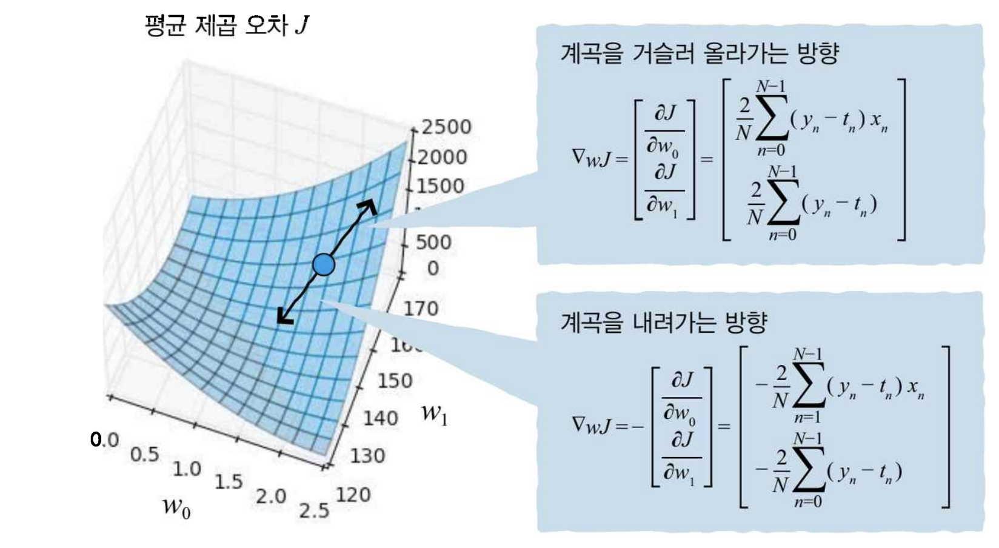

- $J$의 기울기 : $\nabla_w J = \begin{bmatrix} \frac{\partial J}{\partial w_0} & \frac{\partial J}{\partial w_1} \end{bmatrix}^T$

    - 기울기(= 경사, gradient) : 스칼라장의 최대 증가율을 나타내는 벡터장 > 기울기를 나타내는 벡터장을 화살표로 표시할 때, 화살표의 방향 : 증가율이 최대가 되는 방향 / 화살표의 크기 : 증가율이 최대일 때 증가율의 크기

- $J$의 최소화 : $J$의 기울기의 반대 방향 $-\nabla_w J = -\begin{bmatrix} \frac{\partial J}{\partial w_0} & \frac{\partial J}{\partial w_1} \end{bmatrix}^T$ 로 진행

- $w$의 갱신 방법(학습 법칙)을 행렬로 표기 : $w(t+1) = w(t) - \alpha \nabla_w J|_w(t) $

    - $\nabla w J$ 는 $w$의 함수 > 이 $w$에 현재의 $w$값인 $w(t)$를 대입한 값을 $ \nabla_w J|_w(t)$로 표시 > 이 벡터가 현재 지점 $w(t)$의 기울기를 나타냄

- $\alpha$ : 학습률(양수 값을 취하는 매개 변수) > $w$ 갱신의 폭을 조절 (학습률이 크면 갱신은 커지지만 수습이 힘드므로 적당히 줄여야 함)

- 학습 법칙을 성분 표기로 나타냄

    - $w_0(t + 1) = w_0(t) - \alpha \frac{\partial J}{\partial w_0} \Bigg|_{w_0(t), w_1(t)}$  

    - $w_1(t + 1) = w_1(t) - \alpha \frac{\partial J}{\partial w_1} \Bigg|_{w_0(t), w_1(t)}$

- 편미분 계산

    - $J = \frac{1}{N}\displaystyle \sum_{n=0}^{N-1} (y_n - t_n)^2 = \frac{1}{N} \displaystyle\sum_{n=0}^{N-1} (w_0 x_n + w_1 - t_n)^2$

- $w_0$에 대한 편미분 부분을 연쇄 법칙으로 계산

    - $\frac{\partial J}{\partial w_0} = \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (w_0 x_n + w_1 - t_n) x_n = \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (y_n - t_n) x_n$

- $w_1$에 대한 편미분 부분을 연쇄 법칙으로 계산

    - $\frac{\partial J}{\partial w_1} = \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (w_0 x_n + w_1 - t_n) = \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (y_n - t_n)$

- 학습 법칙 

    - $w_0(t + 1) = w_0(t) - \alpha \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (y_n - t_n) x_n$

    - $w_1(t + 1) = w_1(t) - \alpha \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (y_n - t_n)$


In [14]:
# List 5-1-7

# 평균 제곱 오차의 기울기(J의 기울기)
def dmse_line(x, t, w):     # dmse_line(x, t, w) : 기울기를 계산하는 함수
    y = w[0] * x + w[1]     # 인수 데이터 x, t 및 매개 변수 w를 전달하면 
    d_w0 = 2 * np.mean((y-t) * x)
    d_w1 = 2* np.mean(y-t)
    return d_w0, d_w1       # w의 기울기 d_w0, d_w1를 돌려줌

# List 5-1-8
d_w = dmse_line(X, T, [10, 165])
print(np.round(d_w, 1))

[5046.3  301.8]


차례로 $w_0$ 방향과 $w_1$ 방향의 기울기를 나타냄

반복 횟수 13820
W=[1.539947, 136.176160]
dMSE=[-0.005794, 0.099991]
MSE=49.027452


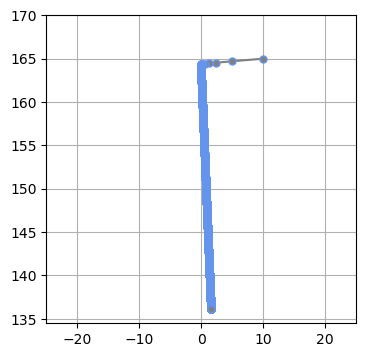

In [26]:
# List 5-1-9

# dmse_line를 이용한 경사 하강법 fit_line_num(x, t) 구현
# fit_line_num(x, t)는 데이터 x, t를 인수로 하여 mse_line을 최소화 하는 w를 돌려줌
# w는 초기 값 w_init = [10.0, 165.0]에서 시작하여 dmse_line에서 구한 기울기 w를 갱신한다.
# 학습 비율(갱신 단계의 폭을 조절) alpha = 0.001
# w이 평평한 곳에 도달하면(기울기가 충분히 적어지면), w의 갱신 종료
# 기울기의 각 요소의 절대 값이 eps=0.1보다 작으면 for문 종료
# 프로그램을 실행하면 마지막으로 얻어진 w값 등을 표시하고, w의 갱신 내역을 그래프로 표시

# 경사 하강법 ---
def fit_line_num(x, t):
    w_init = [10.0, 165.0]      # 초기 매개 변서
    alpha = 0.001       # 학습률
    i_max = 100000      # 반복의 최대 수
    eps = 0.1       # 반복을 종료하는 기울기의 절대값의 한계
    w_i = np.zeros([i_max, 2])
    w_i[0, :] = w_init
    for i in range(1, i_max):
        dmse = dmse_line(x, t, w_i[i-1])
        w_i[i, 0] = w_i[i-1, 0] - alpha * dmse[0]
        w_i[i, 1] = w_i[i-1, 1] - alpha * dmse[1]
        if max(np.absolute(dmse)) < eps:        # 종료 판정, np.absolute는 절대값
            break
    w0 = w_i[i,0]
    w1 = w_i[i,1]
    w_i = w_i[:i, :]
    return w0, w1, dmse, w_i

# Main ---
plt.figure(figsize=(4,4))       # MSE의 등고선 표시
xn = 100        # 등고선 해상도
w0_range = [-25,25]
w1_range = [120, 170]
x0 = np.linspace(w0_range[0], w0_range[1], xn)
x1 = np.linspace(w1_range[1], w1_range[1], xn)
xx0, xx1 = np.meshgrid(x0, x1)
J = np.zeros((len(x0), len(x1)))
for i0 in range(xn):
    for i1 in range(xn):
        J[i1, i0] = mse_line(X, T, (x0[i0], x1[i1]))
cont = plt.contour(xx0, xx1, J, 30, colors='black', levels=(100, 1000, 10000, 100000))
cont.clabel(fmt='%1.0f', fontsize = 8)
plt.grid(True)

# 경사 하강법 호출
W0, W1, dMSE, W_history = fit_line_num(X, T)

# 결과 보기
print('반복 횟수 {0}'.format(W_history.shape[0]))
print('W=[{0:.6f}, {1:.6f}]'.format(W0, W1))
print('dMSE=[{0:.6f}, {1:.6f}]'.format(dMSE[0], dMSE[1]))
print('MSE={0:.6f}'.format(mse_line(X, T, [W0, W1])))
plt.plot(W_history[:, 0], W_history[:, 1], '.-', color='gray', markersize=10, markeredgecolor='cornflowerblue')
plt.show()


평균 제곱 오차 $J$의 등고선 위에 $w$의 갱신의 모습 나타냄 

![스크린샷 2024-07-08 19.23.23.png](<attachment:스크린샷 2024-07-08 19.23.23.png>)

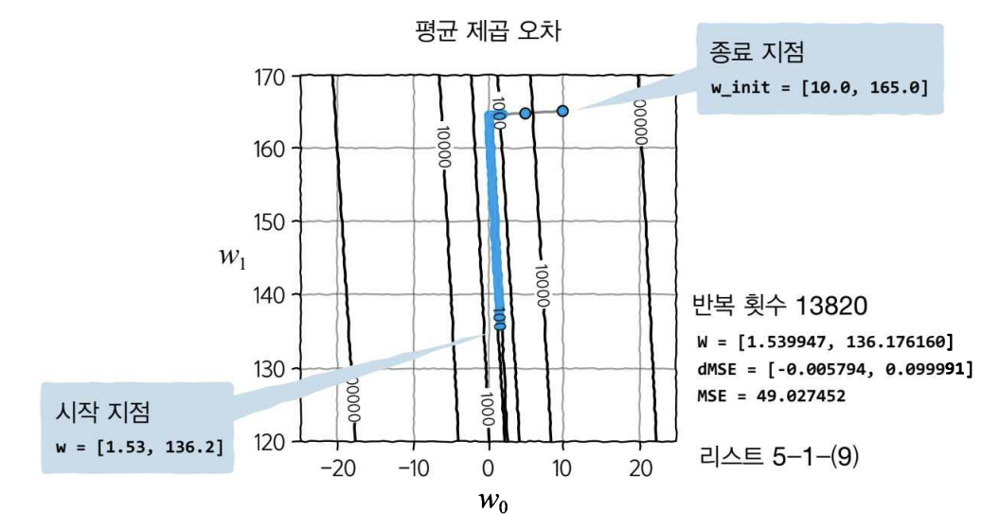

w0=1.540, w1=136.176
SD=7.002 cm


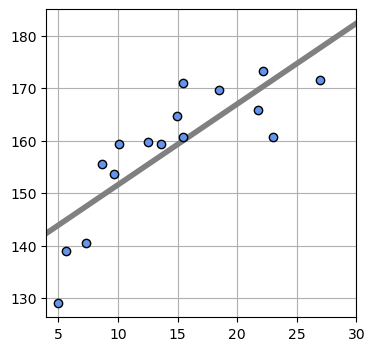

In [28]:
# List 5-1-10

# 구한 w0, 21의 값을 직선 식에 대입하여 데이터 분포에 겹쳐서 그림 
# 선 표시 ---
def show_line(w):
    xb = np.linspace(X_min, X_max, 100)
    y = w[0] * xb + w[1]
    plt.plot(xb, y, color=(.5, .5, .5), linewidth=4)
    
# Main ---
plt.figure(figsize=(4,4))
W=np.array([W0, W1])
mse = mse_line(X, T, W)
print("w0={0:.3f}, w1={1:.3f}".format(W0,W1))
print("SD={0:.3f} cm".format(np.sqrt(mse)))
show_line(W)
plt.plot(X, T, marker='o', linestyle='None', color='cornflowerblue', markeredgecolor='black')
plt.xlim(X_min, X_max)
plt.grid(True)
plt.show()

- 표준 편차(SD, Stantard deviation) : 평균 제곱 오차의 제곱근

    - 오차가 대략 7.00cm 
        
        - 오차가 정규 분포를 따른다고 가정했을 때, 전체의 68%의 데이터 점에서 오차가 7.00cm 이하이다.

        - 정규 분포의 경우, 평균에서의 차이가 플러스 마이너스 SD의 범위에 분포의 68%가 들어가기 때문

- $J$의 기울기만 구할 수 있으면, 최소 제곱법으로 극소값을 구할 수 있다.

- 극솟값 $\neq$ 전체의 최솟값 

### 5.1.4. 선형 모델 매개 변수의 해석해 

- 수치해 : 반복 계산에 의해 근사값을 구하는 수치 계산법(경사 하강법)

- 해석해 : 방정식을 해결하여 정확한 해를 구하는 계산법

    - 1회 계산으로 최적의 $w$ 구할 수 있음

    - 문제의 본질 잘 이해 / 다차원 데이터에 대응 / 곡선 모델로 확장하기 좋음

- 목표 : $J$가 극소화 되는 지점 $w$ 찾기 : 기울기 = 0 

    - $
\frac{\partial J}{\partial w_0} = \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (w_0 x_n + w_1 - t_n)x_n = 0
$

    - $
\frac{\partial J}{\partial w_1} = \frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (w_0 x_n + w_1 - t_n) = 0
$

- 양 변을 2로 나누고 합의 기호 밖으로 꺼냄

    - $w_0 \frac{1}{N} \displaystyle \sum _{n=0}^{N-1} x_n^2 +w_1 \frac{1}{N} \displaystyle \sum _{n=0}^{N-1} x_n - \frac{1}{N} \displaystyle \sum _{n=0}^{N-1} t_n x_n = 0 $

    - $ \frac{1}{N} \displaystyle \sum _{n=0}^{N-1} x_n^2$ : <$x^2$>  : 입력 데이터 x의 제곱의 평균

    - $\frac{1}{N} \displaystyle \sum _{n=0}^{N-1} x_n$ : <$x$>  : 입력 데이터 x의 평균

    - $\frac{1}{N} \displaystyle \sum _{n=0}^{N-1} t_n x_n$ : <$tx$>  :목표 및 입력 데이터의 곱의 평균

- < $f(x)$ >로 $f(x)$의 평균 나타냄

    - $w_0 <x^2> + w_1<x> -<tx> = 0 $ 

    - $w_0<x> +w_1 - <t> = 0 $

- 식 정리 : $w$의 해석해 ($<x^2>$ : $x^2$의 평균 / $<x>^2$ : $<x>$의 제곱)

    - $w_0 = \frac{<tx>-<t><x>}{<x^2>-<x>^2} $

    - $w_1 = <t> -w_0<x> $ = $<t> - \frac{<tx>-<t><x>}{<x^2>-<x>^2} <x>$
    

w0=1.558, w1=135.872
SD=7.001 cm


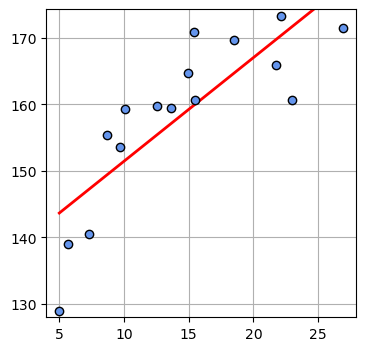

In [11]:
# List 5-1-11

import numpy as np
import matplotlib.pyplot as plt

# 데이터 정의
np.random.seed(seed=1) # 난수 고정
X_min = 4 # X의 하한(표시용)
X_max = 30 # X의 상한(표시용)
X_n = 16 # X의 상한(표시용)
X = 5 + 25 * np.random.rand(X_n)
Prm_c = [170, 108, 0.2] # 생성 매개 변수
T = Prm_c[0] - Prm_c[1] * np.exp(-Prm_c[2] * X) \
+ 4 * np.random.randn(X_n) # (A)
np.savez('ch5_data.npz', X=X, X_min=X_min, X_max=X_max, X_n=X_n, T=T) # (B)

# 평균 제곱 오차의 기울기(J의 기울기)
def dmse_line(x, t, w):     # dmse_line(x, t, w) : 기울기를 계산하는 함수
    y = w[0] * x + w[1]     # 인수 데이터 x, t 및 매개 변수 w를 전달하면 
    d_w0 = 2 * np.mean((y-t) * x)
    d_w1 = 2* np.mean(y-t)
    return d_w0, d_w1       # w의 기울기 d_w0, d_w1를 돌려줌

# 해석해 --------------------------------------
def fit_line(x, t):
    mx = np.mean(x)
    mt = np.mean(t)
    mtx = np.mean(t * x)
    mxx = np.mean(x * x)
    w0 = (mtx - mt * mx) / (mxx - mx**2)
    w1 = mt - w0 * mx
    return np.array([w0, w1])

# 평균 제곱 오차 계산 함수 정의
def mse_line(x, t, w):
    y = w[0] * x + w[1]
    mse = np.mean((y - t) ** 2)
    return mse

# 회귀선 표시 함수 정의
def show_line(w):
    x = np.array([X.min(), X.max()])
    y = w[0] * x + w[1]
    plt.plot(x, y, color='red', linewidth=2)

# 메인 --------------------------------------
W = fit_line(X, T)
print("w0={0:.3f}, w1={1:.3f}".format(W[0], W[1]))
mse = mse_line(X, T, W)
print("SD={0:.3f} cm".format(np.sqrt(mse)))
plt.figure(figsize=(4, 4))
show_line(W)
plt.plot(X, T, marker='o', linestyle='None', 
         color='cornflowerblue', markeredgecolor='black')
plt.xlim(X.min() - 1, X.max() + 1)
plt.ylim(T.min() - 1, T.max() + 1)
plt.grid(True)
plt.show()

![스크린샷 2024-07-10 15.14.55.png](<attachment:스크린샷 2024-07-10 15.14.55.png>)

- 직선으로 피팅한다면 해석해를 도출할 수 있으므로 경사 하강법을 사용할 필요가 없다. 

- 경사 하강법 : 해석해가 구해지지 않는 모델에서 힘을 발휘
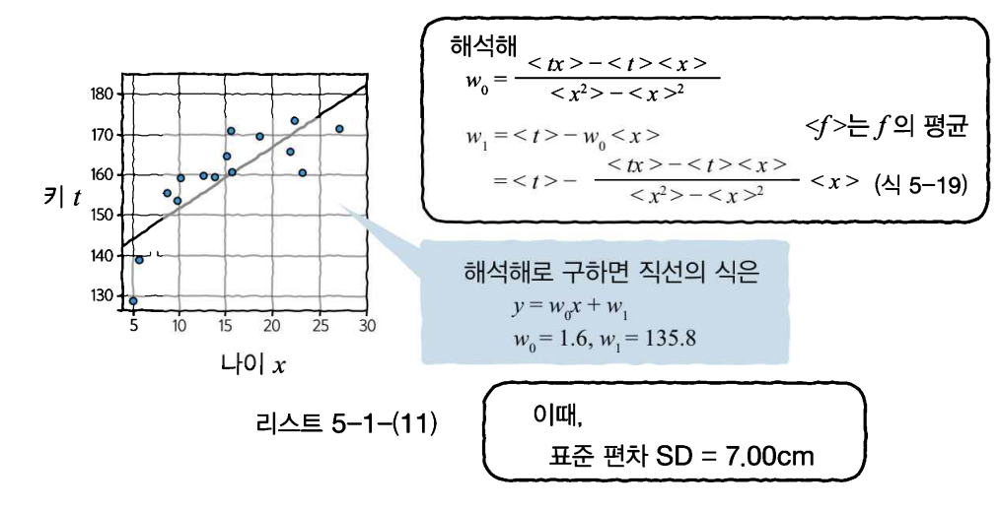

## 5.2 2차원 입력면 모델

- 입력이 2차원인 경우, $x = (x_0, x_1)$로 확장

- 원래 나이 $x$ = X0, 몸무게 데이터 = X1, 키 = T

In [14]:
# List 5-1-12

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

# 2차원 데이터 생성 ---
X0 = X
X0_min = 5 
X0_max = 30
np.random.seed(seed=1)      # 난수를 고정
X1 = 23 * (T / 100) **2 +2 *np.random.randn(X_n)
X1_min = 40
X1_max = 75

# List 5-1-13
print(np.round(X0, 2))
print(np.round(X1, 2))
print(np.round(T, 2))

[15.43 23.01  5.   12.56  8.67  7.31  9.66 13.64 14.92 18.47 15.48 22.13
 10.11 26.95  5.68 21.76]
[70.43 58.15 37.22 56.51 57.32 40.84 57.79 56.94 63.03 65.69 62.33 64.95
 57.73 66.89 46.68 61.08]
[170.91 160.68 129.   159.7  155.46 140.56 153.65 159.43 164.7  169.65
 160.71 173.29 159.31 171.52 138.96 165.87]


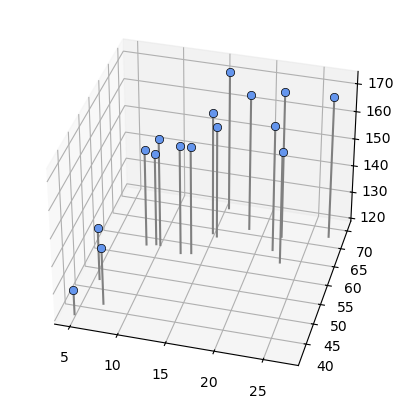

In [20]:
# List 5-1-14

# 2차원 데이터의 표시 --- 
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 2차원 데이터의 표시 ---
def show_data2(ax, x0, x1, t):
    for i in range(len(x0)):
        ax.plot([x0[i], x0[i]], [x1[i], x1[i]], [120, t[i]], color='gray')
    ax.plot(x0, x1, t, 'o', color='cornflowerblue', markeredgecolor='black', markersize=6, markeredgewidth=0.5)
    ax.view_init(elev=35, azim=-75)

# Main ---
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')
show_data2(ax, X0, X1, T)
plt.show()

### 5.2.1 데이터의 표시 방법

- 데이터 번호 : $n$ 

- 데이터 요소 : $m$ 

- 데이터 번호 $n$의 모든 요소 $x$ 

    - $x_n = [x_{n,0}, x_{n,1}, \cdots , x_{n, M-1} ]$

    - $
\mathbf{x}_m = \begin{bmatrix}
x_{0,m} \\
x_{1,m} \\
\vdots \\
x_{N-1,m}
\end{bmatrix}
$

    - $
\mathbf{t} = \begin{bmatrix}
t_{0} \\
t_{1} \\
\vdots \\
t_{N-1}
\end{bmatrix}
$



### 5.2.2. 면 모델

- 2차원 벡터  $\mathbf{x}_n : \mathbf{x}n = [x{n,0}, x_{n,1}]$ 로 표현됩니다.


- 각 벡터  $\mathbf{x}_n$ 에는 타겟 값  $t_n$ 이 대응됩니다.

- 3차원 플롯을 이용하여 각각의 축에서  x_{m=0} ,  x_{m=1} ,  t 를 시각화

- 시각화는 데이터를 직관적으로 이해하고, 새로운 데이터  $\mathbf{x} = [x_0, x_1]$ 에 대해 타겟 값  t 를 예측하는 데 도움됨

- 모델을 학습시키고, 학습된 모델을 이용하여 새로운 입력 값에 대한 출력을 얻는 과정

![스크린샷 2024-07-10 15.40.48.png](<attachment:스크린샷 2024-07-10 15.40.48.png>)
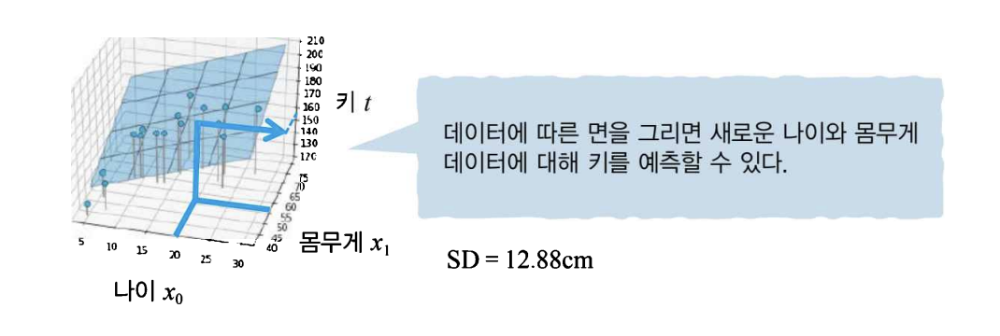

3d=12.876cm


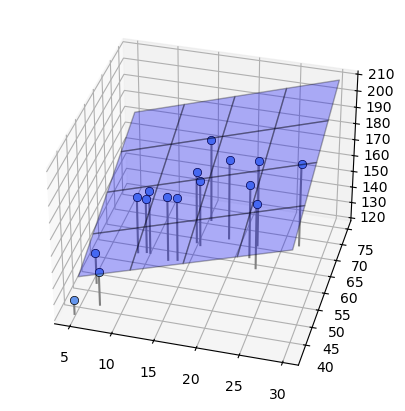

In [23]:
# List 5-1-15

# 임의의 w에 면을 그리는 show_plane(ax,w) wnsql
# ax : 3차원 그래프를 그릴 때 필요한 묘사 대상 그래프의 id
# 평균 제곱 오차(mse)를 계산하는 함수 : mse_plane(x0, x1, t, w)

# 면의 표시 ---
def show_plane(ax, w):
    px0 = np.linspace(X0_min, X0_max, 5)
    px1 = np.linspace(X1_min, X1_max, 5)
    px0, px1 = np.meshgrid(px0, px1)
    y = w[0]*px0 + w[1] * px1 +w[2]
    ax.plot_surface(px0, px1, y, rstride=1, cstride=1, alpha=0.3, color='blue', edgecolor='black')

# 면의 MSE ---
def mse_plane(x0, x1, t, w):
    y = w[0] *x0 + w[1] *x1 + w[2]      # (A)
    mse = np.mean((y-t)**2)
    return mse

# Main ---
plt.figure(figsize=(6, 5))
ax =plt.subplot(1, 1, 1, projection='3d')
W=[1.5, 1, 90]
show_plane(ax, W)
show_data2(ax, X0, X1, T)
mse = mse_plane(X0, X1, T, W)
print("3d={0:.3f}cm".format(np.sqrt(mse)))
plt.show()

 $$ y(x) = w_0 x_0 + w_1 x_1 + w_2 $$
 
 - $w_0, w_1, w_2$에 다양한 값 넣어서 여러 위치와 기울기 가진 면 표현 가능

 - $(x_0, x_1, y)$를 여러 번 반복한 점의 집합 : 평평한 표면 형성
 


### 5.2.3. 매개 변수의 해석해

- $w= [w_0, w_1, w_2]$ 

- MSE $
J = \frac{1}{N} \sum_{n=0}^{N-1} (y(x_n) - t_n)^2 = \frac{1}{N} \sum_{n=0}^{N-1} (w_0 x_{n,0} + w_1 x_{n,1} + w_2 - t_n)^2
$

- 목표 : $J$가 가장 작아지는 $w= [w_0, w_1, w_2]$ 구하기

- $J$를 최소화하는 최적의 $w$ : 기울기 = 0 ($J$의 변화율 = 0)

    - $
\frac{\partial J}{\partial w_0} = 0, \quad \frac{\partial J}{\partial w_1} = 0, \quad \frac{\partial J}{\partial w_2} = 0
$

- $w_0$에 대한 편미분

    - $
\frac{\partial J}{\partial w_0} = \frac{2}{N} \sum_{n=0}^{N-1} (w_0 x_{n,0} + w_1 x_{n,1} + w_2 - t_n) x_{n,0}
$ 

    - $= 2 \left\{ w_0 \langle x_0^2 \rangle + w_1 \langle x_0 x_1 \rangle + w_2 \langle x_0 \rangle - \langle t x_0 \rangle \right\} = 0
$

- $w_1$에 대한 편미분

    - $
\frac{\partial J}{\partial w_1} = \frac{2}{N} \sum_{n=0}^{N-1} (w_0 x_{n,0} + w_1 x_{n,1} + w_2 - t_n) x_{n,1}
$

    - $
= 2 \left\{ w_0 \langle x_0 x_1 \rangle + w_1 \langle x_1^2 \rangle + w_2 \langle x_1 \rangle - \langle t x_1 \rangle \right\} = 0
$

- $w_2$에 대한 편미분

    - $
\frac{\partial J}{\partial w_2} = \frac{2}{N} \sum_{n=0}^{N-1} (w_0 x_{n,0} + w_1 x_{n,1} + w_2 - t_n)
$

    - $
= 2 \left\{ w_0 \langle x_0 \rangle + w_1 \langle x_1 \rangle + w_2 - \langle t \rangle \right\} = 0
$

- 연립 방정식 

    - $
w_0 = \frac{\mathrm{cov}(t, x_1) \mathrm{cov}(x_0, x_1) - \mathrm{var}(x_1) \mathrm{cov}(t, x_0)}{\mathrm{cov}(x_0, x_1)^2 - \mathrm{var}(x_0) \mathrm{var}(x_1)}
$

    - $
w_1 = \frac{\mathrm{cov}(t, x_0) \mathrm{cov}(x_0, x_1) - \mathrm{var}(x_0) \mathrm{cov}(t, x_1)}{\mathrm{cov}(x_0, x_1)^2 - \mathrm{var}(x_0) \mathrm{var}(x_1)}
$

    - $
w_2 = -w_0 \langle x_0 \rangle - w_1 \langle x_1 \rangle + \langle t \rangle
$
- $a$의 분산 : $var(a) = <a^2> -<a>^2 $

    - $a$의 분산 : $a$와 얼마나 차이가 있는지 

    - 그 확률변수가 기댓값으로부터 얼마나 떨어진 곳에 분포하는지를 가늠하는 숫자

- $a$와 $b$의 공분산 : $cov(a, b) = <ab> - <a><b> $

    - $a$와 $b$의 공분산 : $a$와 $b$가 서로 얼마나 영향을 끼치고 있는지

    - 2개의 확률변수의 상관정도를 나타내는 값

w0=0.5, w1=1.1, w2=89.0
SD=2.546cm


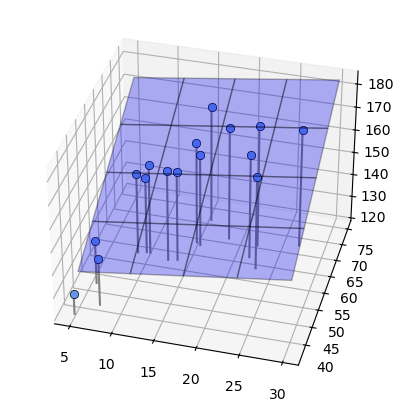

In [33]:
# List 5-1- 16

import numpy as np
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D


# 실제 입력 데이터에 X0, X1과 목표 데이터 T의 값을 넣어 w0, w1, w2를 구하고 면을 그린다

# 해석해 ---
def fit_plane(x0, x1, t):
    c_tx0 = np.mean(t*x0) - np.mean(t) *np.mean(x0)
    c_tx1 = np.mean(t*x1) - np.mean(t) *np.mean(x1)
    c_x0x1 = np.mean(x0*x1) - np.mean(x0) *np.mean(x1)
    v_x0=np.var(x0)
    v_x1=np.var(x1)
    w0 = (c_tx1 * c_x0x1 - v_x1 * c_tx0) / (c_x0x1 **2 -v_x0 *v_x1)
    w1 = (c_tx0 * c_x0x1 - v_x0 * c_tx1) / (c_x0x1 **2 -v_x0 *v_x1)
    w2 = -w0 * np.mean(x0) - w1 * np.mean(x1) + np.mean(t)
    return np.array([w0, w1, w2])

# Main ---ㅇ
plt.figure(figsize=(6, 5))
ax = plt.subplot(1, 1, 1, projection='3d')
W = fit_plane(X0, X1, T)
print("w0={0:.1f}, w1={1:.1f}, w2={2:.1f}".format(W[0], W[1], W[2]))
show_plane(ax, W)
show_data2(ax, X0, X1, T)
mse = mse_plane(X0, X1, T, W)
print("SD={0:.3f}cm".format(np.sqrt(mse)))
plt.show()
    

![스크린샷 2024-07-10 16.15.27.png](<attachment:스크린샷 2024-07-10 16.15.27.png>)
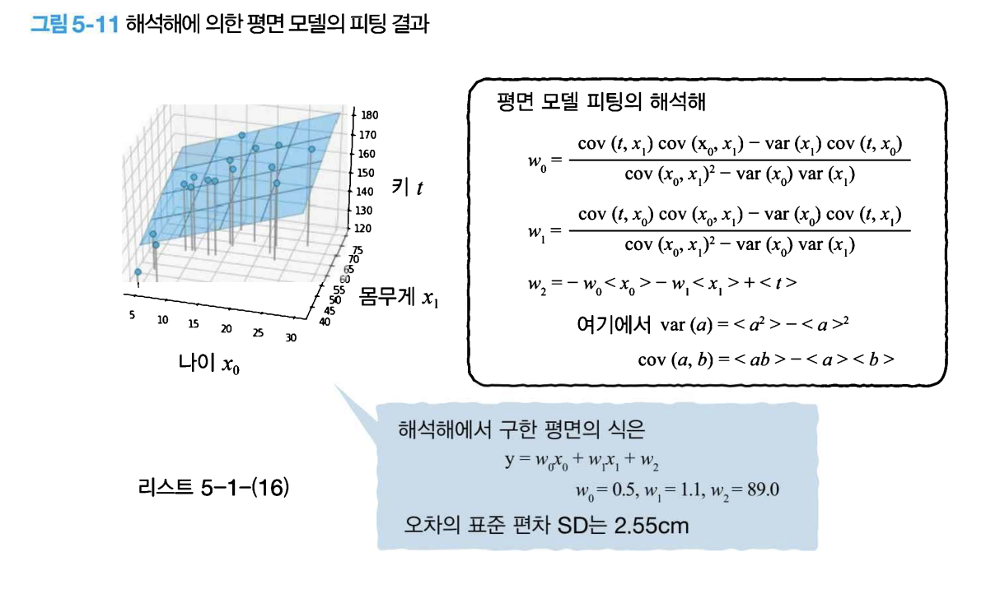

## 5.3 D차원 선형 회귀 모델

### 5.3.1. D차원 선형 회귀 모델

- 선형 회귀 모델

    - $
y(x) = w_0 x_0 + w_1 x_1 + \cdots + w_{D-1} x_{D-1} + w_D
$

    - 절편 $w_D$가 포함되지 않을 때, 원점 $ x = [0, 0, $ $\cdots$ , 0] 을 대입하면 y = 0 > 항상 원점을 지나는 평면이다.

- $
y(x) = w_0 x_0 + w_1 x_1 + \cdots + w_{D-1} x_{D-1} = [w_0 \cdots w_{D-1}] \begin{bmatrix} x_0 \\ \vdots \\ x_{D-1} \end{bmatrix} = \mathbf{w}^T \mathbf{x} $

- $
\mathbf{w} = \begin{bmatrix} w_0 \\ \vdots \\ w_{D-1} \end{bmatrix}
$


### 5.3.2. 매개 변수의 해석해

- $ J(w) = \frac{1}{N}\displaystyle \sum_{n=0}^{N-1} (y(x_n) - t_n)^2 = \frac{1}{N} \sum_{n=0}^{N-1} (\mathbf{w}^T \mathbf{x}_n - t_n)^2 $

- $ \frac{\partial J}{\partial w_i} = \frac{1}{N} \displaystyle\sum_{n=0}^{N-1} \frac{\partial}{\partial w_i} (\mathbf{w}^T \mathbf{x}_n - t_n)^2 = \frac{2}{N} \sum_{n=0}^{N-1} (\mathbf{w}^T \mathbf{x}_n - t_n) x_{n,i} $

- $\frac{2}{N} \displaystyle\sum_{n=0}^{N-1} (\mathbf{w}^T \mathbf{x}_n - t_n) x_{n,i} = 0 $ > $\displaystyle\sum_{n=0}^{N-1} (\mathbf{w}^T \mathbf{x}_n - t_n) x_{n,i} = 0 $ 

    - 모든 $i$에 대해 성립

![스크린샷 2024-07-10 16.36.34.png](<attachment:스크린샷 2024-07-10 16.36.34.png>)

![스크린샷 2024-07-10 16.37.22.png](<attachment:스크린샷 2024-07-10 16.37.22.png>)

![스크린샷 2024-07-10 16.42.34.png](<attachment:스크린샷 2024-07-10 16.42.34.png>)
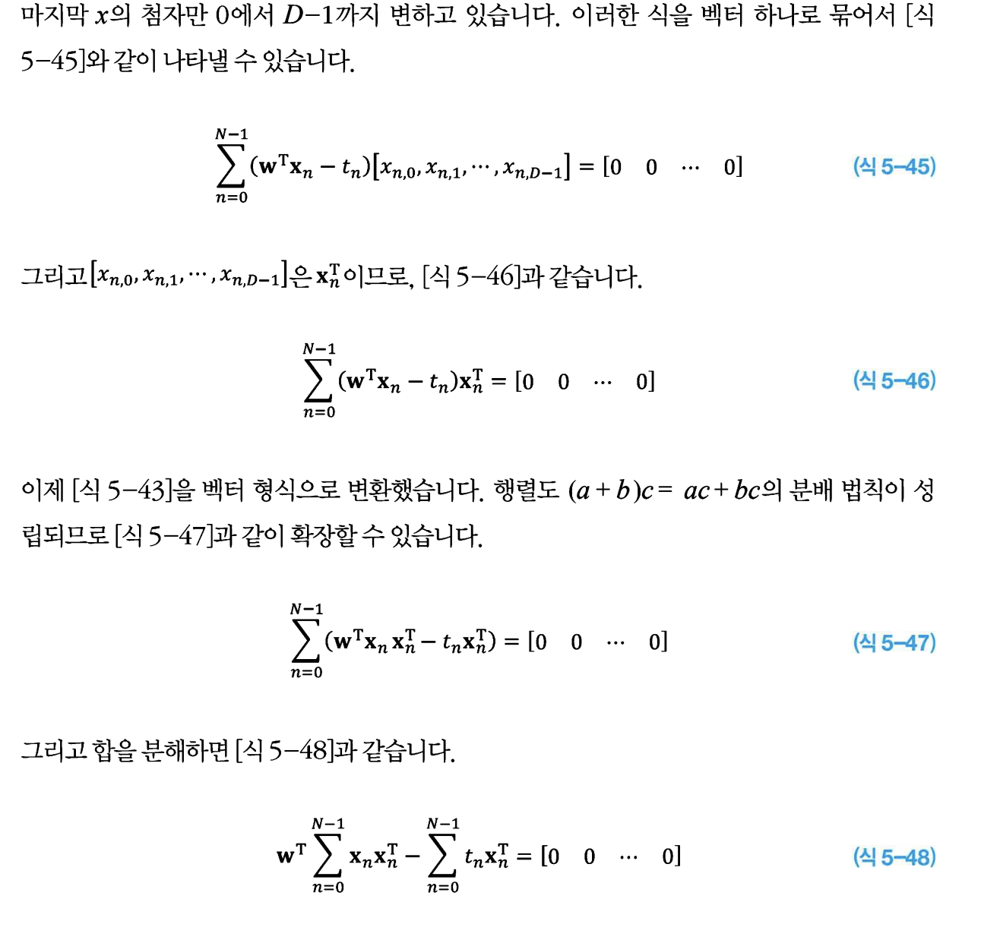
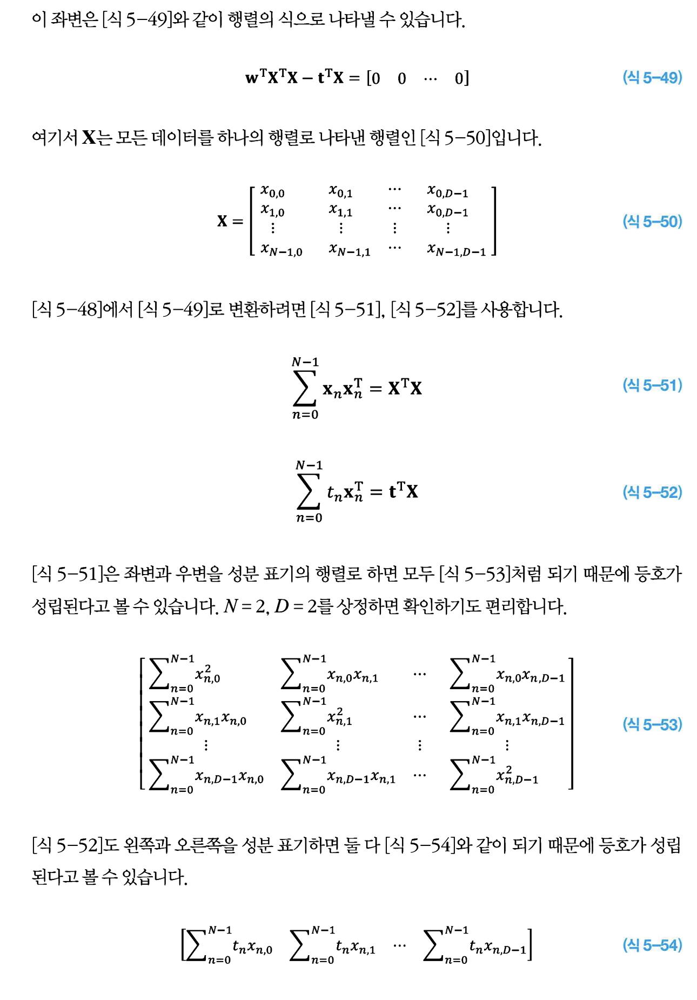
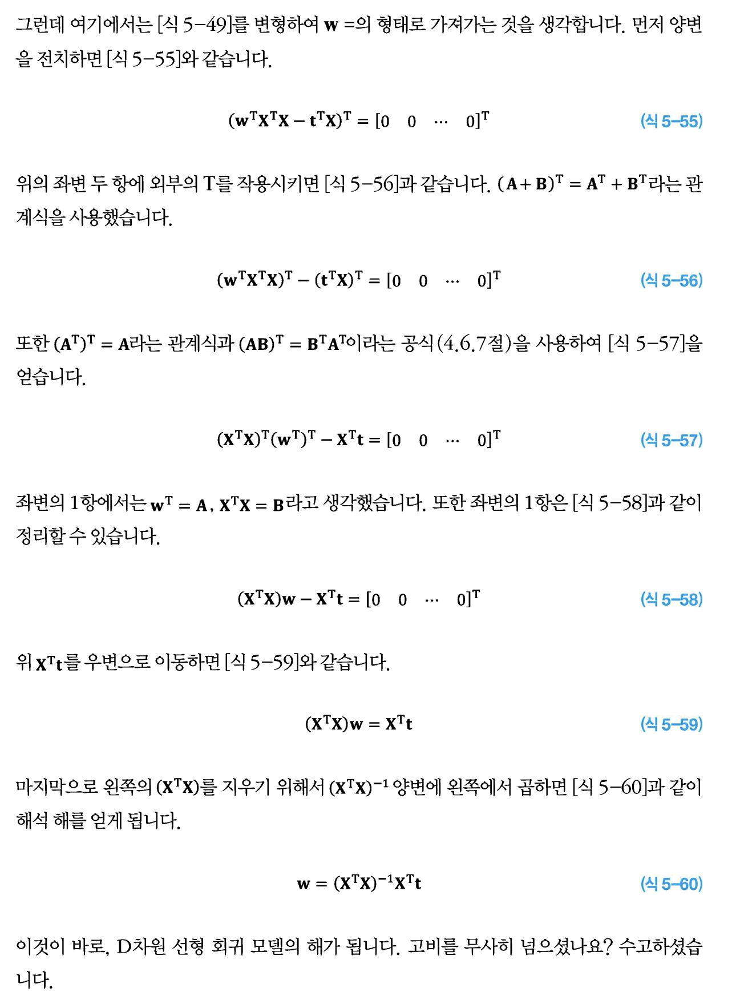

- [식 5-60] : $x$가 어떤 차원이더라도 모두 이 형태에서 최적의 $w$를 얻을 수 있다. 

- $(X^TX)^{-1} X^T $ : 무어-펜로즈 의사 역행렬(Moore-Penrose Pseu)

    - 의사 역행렬 : 정방 행렬이 아닌 행렬에 정의할 수 있는 역행렬의 대체 버전
    

### 5.3.3. 원점을 지나지 않는 면에 대한 확장

![스크린샷 2024-07-10 16.46.42.png](<attachment:스크린샷 2024-07-10 16.46.42.png>)
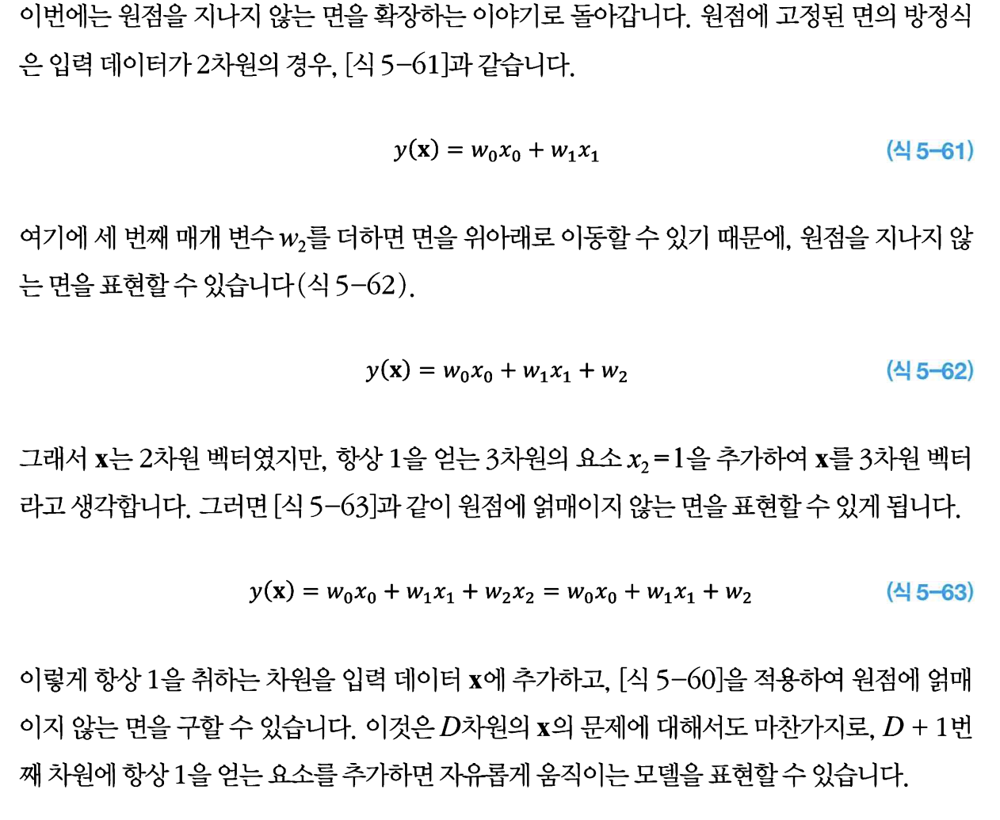

## 5.4 선형 기저 함수 모델

![스크린샷 2024-07-10 16.49.07.png](<attachment:스크린샷 2024-07-10 16.49.07.png>)

- 선형 기저 함수 모델(곡선)

    - 기저 함수 : 바탕이 되는 함수 : $\phi_j(x)$ > 가우스 함수를 기저 함수로 선택

    - 선형 회귀 모델의 x를 기저 함수 $\phi(x)$로 대체해 여러 형태의 함수를 만드는 것

$$ \phi_j(x) = \exp \left\{ - \frac{(x - \mu_j)^2}{2s^2} \right\} $$

- 가우스 함수의 중심 위치 : $\mu_j$

- $s$ : 가우스 함수의 공통의 매개 변수 : 함수의 확장 정도는 $s$로 조절됨.

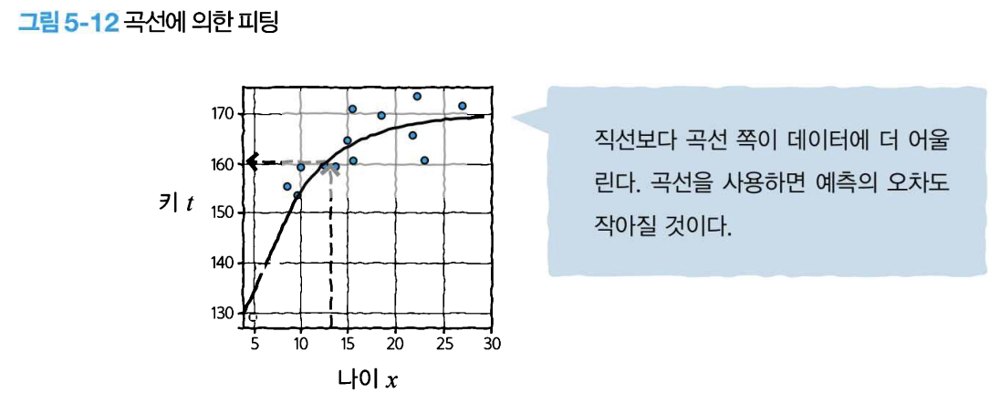

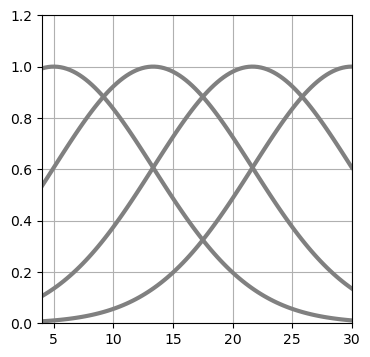

In [37]:
# List 5-2-1
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# 데이터 로드 ---
outfile = np.load('ch5_data.npz')
X = outfile['X']
X_min = outfile['X_min']
X_max = outfile['X_max']
X_n = outfile['X_n']
T = outfile['T']

# List 5-2-2

# 가우스 함수 --- 
def gauss(x, mu, s):
    return np.exp(-(x-mu)**2 / (2* s**2))

# List 5-2-3

# 4개의 가우스 함수(M=4)를 나이의 범위 5~30으로 일정한 간격으로 배치하여 표시
# s는 인접한 가우스 함수 중심 사이의 거리

# Main ---
M = 4
plt.figure(figsize=(4,4))
mu = np.linspace(5, 30, M)
s = mu[1] - mu[0]       # (A)
xb = np.linspace(X_min, X_max, 100)
for j in range(M):
    y = gauss(xb, mu[j], s)
    plt.plot(xb, y, color='gray', linewidth=3)
plt.grid(True)
plt.xlim(X_min, X_max)
plt.ylim(0, 1.2)
plt.show()

![스크린샷 2024-07-10 17.21.43.png](<attachment:스크린샷 2024-07-10 17.21.43.png>)
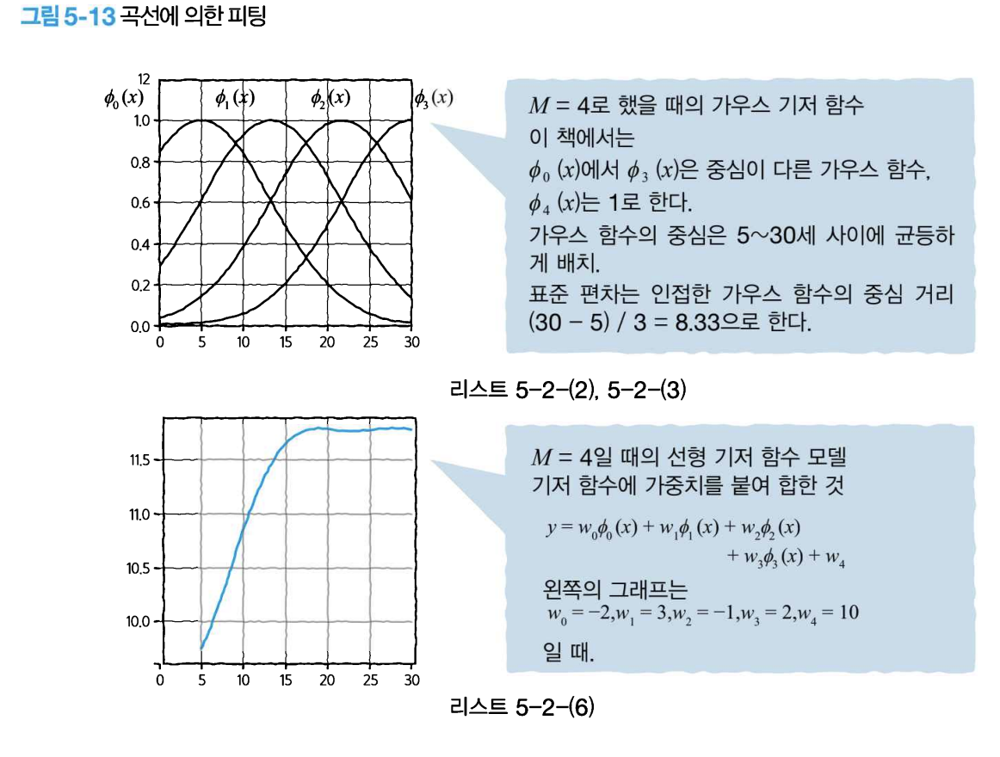

![스크린샷 2024-07-10 17.07.24.png](<attachment:스크린샷 2024-07-10 17.07.24.png>)

- 선형 기저 함수 모델 : "$\phi(x_n)$를 입력 $x_n$으로 해석한 선형 회귀 모델"

![스크린샷 2024-07-10 17.09.08.png](<attachment:스크린샷 2024-07-10 17.09.08.png>)


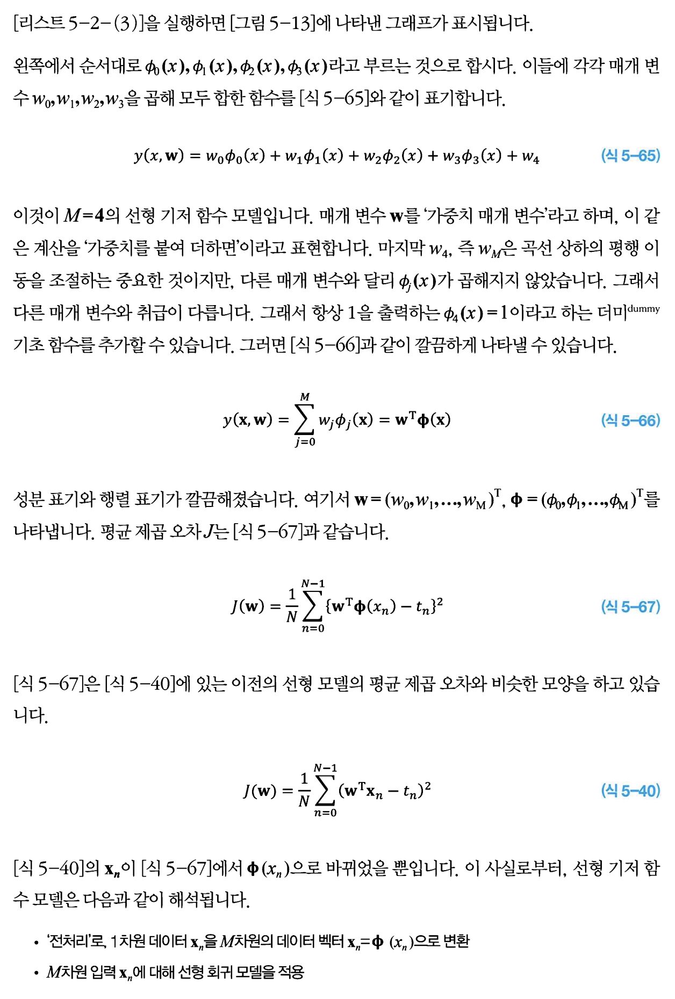
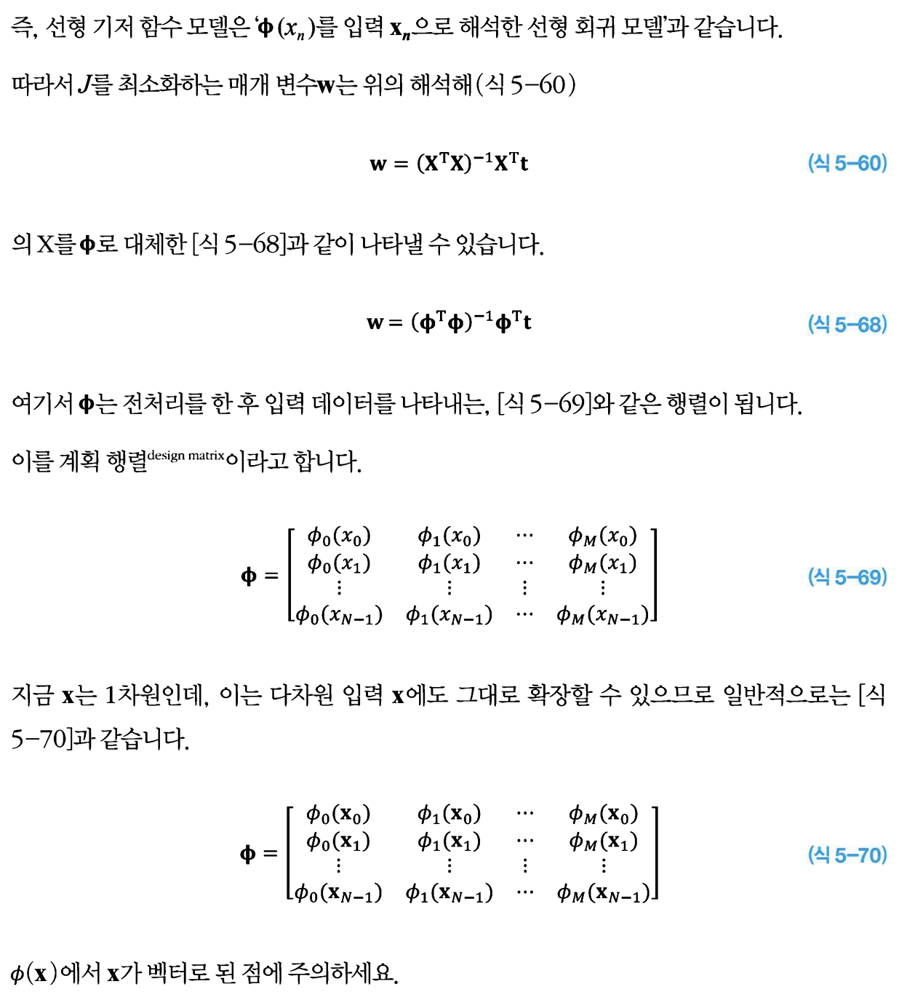

W=[29.4 75.7  2.9 98.3 54.9]
SD=3.98 cm


<function matplotlib.pyplot.show(close=None, block=None)>

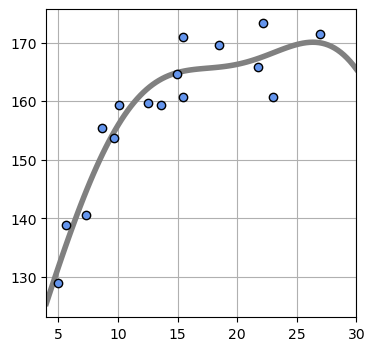

In [39]:
# List 5-2-4 

# [식 5-68]를 사용하여 최적의 매개 변수 w 찾기
# 선형 기저 함수 모델 gauss_func(w, x) 정의

# 선형 기저 함수 모델 ---
def gauss_func(w, x):
    m = len(w) - 1
    mu = np.linspace(5, 30, m)
    s = mu[1] - mu[0]
    y = np.zeros_like(x)        # x와 같은 크기로 요소가 0의 행렬 y를 작성
    for j in range(m):
        y = y + w[j] * gauss(x, mu[j], s)
    y = y + w[m]
    return y

# List 5-2-5

# 선형 기저 함수 모델 MSE ---
def mse_gauss_func(x, t, w):        # 평균 제곱 오차를 계산하는 함수 : 피팅의 수준을 산출
    y = gauss_func(w, x)            # mse_gauss_func(x, t, w)
    mse = np.mean((y - t) **2)
    return mse

# List 5-2-6

# 선형 기저 함수 모델의 정확한 해 ---
def fit_gauss_func(x, t, m):        # 선형 기저 함수 모형의 매개 변수의 해석해를 제공
    mu = np.linspace(5, 30, m)      # fit_gauss_func(x, t, m)
    s = mu[1] - mu[0]
    n = x.shape[0]
    psi = np.ones((n, m+1))
    for j in range(m):
        psi[:, j] = gauss(x, mu[j], s)
    psi_T = np.transpose(psi)

    b = np.linalg.inv(psi_T.dot(psi))
    c = b.dot(psi_T)
    w = c.dot(t)
    return w

# List 5-2-7

# 가우스 기저 함수 표시 ---
def show_gauss_func(w):
    xb = np.linspace(X_min, X_max, 100)
    y = gauss_func(w, xb)
    plt.plot(xb, y, c=[.5, .5, .5], lw=4)

# Main ---
plt.figure(figsize=(4,4))
M = 4
W = fit_gauss_func(X, T, M)
show_gauss_func(W)
plt.plot(X, T, marker='o', linestyle='None', color='cornflowerblue', markeredgecolor='black')
plt.xlim(X_min, X_max)
plt.grid(True)
mse = mse_gauss_func(X, T, W)
print('W=' + str(np.round(W,1)))
print("SD={0:.2f} cm".format(np.sqrt(mse)))
plt.show

- 선형 기저 함수 모델의 피팅 결과

- 항상 1을 출력하는 더미 함수와 [그림 5-13]에 나타난 4개의 가우스 기저 함수를 합한 결과

- 오차의 표준 편차 SD = 3.98

![스크린샷 2024-07-10 17.22.36.png](<attachment:스크린샷 2024-07-10 17.22.36.png>)
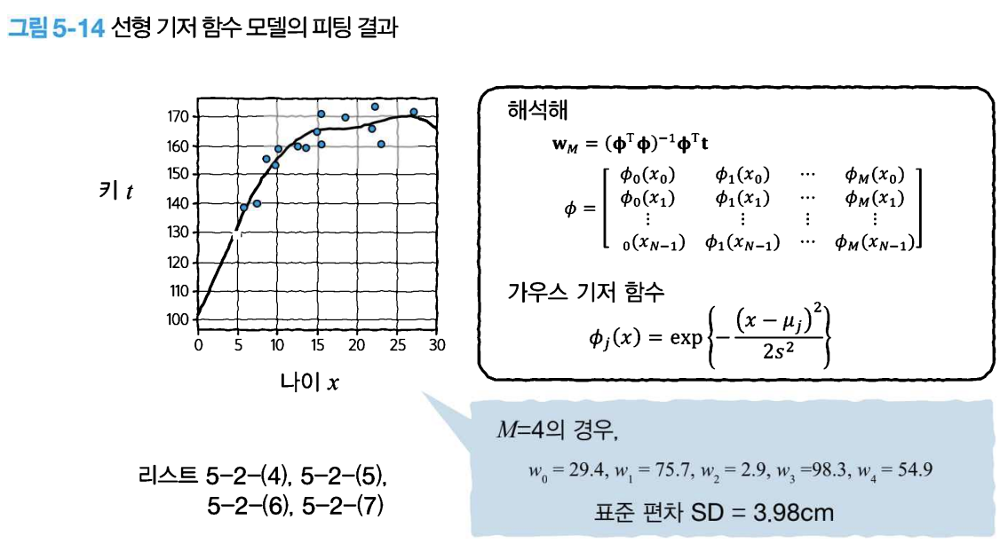

## 5.5 오버피팅의 문제


- 기저 함수의 수 $M$은 어떻게 정할까?

W=[29.4 75.7  2.9 98.3 54.9]
SD=3.98 cm


<function matplotlib.pyplot.show(close=None, block=None)>

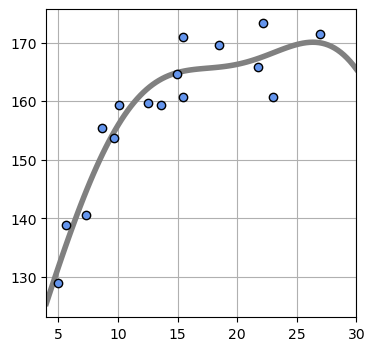

In [60]:
# List 5-2-4 

# [식 5-68]를 사용하여 최적의 매개 변수 w 찾기
# 선형 기저 함수 모델 gauss_func(w, x) 정의

# 선형 기저 함수 모델 ---
def gauss_func(w, x):
    m = len(w) - 1
    mu = np.linspace(5, 30, m)
    s = mu[1] - mu[0]
    y = np.zeros_like(x)        # x와 같은 크기로 요소가 0의 행렬 y를 작성
    for j in range(m):
        y = y + w[j] * gauss(x, mu[j], s)
    y = y + w[m]
    return y

# List 5-2-5

# 선형 기저 함수 모델 MSE ---
def mse_gauss_func(x, t, w):        # 평균 제곱 오차를 계산하는 함수 : 피팅의 수준을 산출
    y = gauss_func(w, x)            # mse_gauss_func(x, t, w)
    mse = np.mean((y - t) **2)
    return mse

# List 5-2-6

# 선형 기저 함수 모델의 정확한 해 ---
def fit_gauss_func(x, t, m):        # 선형 기저 함수 모형의 매개 변수의 해석해를 제공
    mu = np.linspace(5, 30, m)      # fit_gauss_func(x, t, m)
    s = mu[1] - mu[0]
    n = x.shape[0]
    psi = np.ones((n, m+1))
    for j in range(m):
        psi[:, j] = gauss(x, mu[j], s)
    psi_T = np.transpose(psi)

    b = np.linalg.inv(psi_T.dot(psi))
    c = b.dot(psi_T)
    w = c.dot(t)
    return w

# List 5-2-7

# 가우스 기저 함수 표시 ---
def show_gauss_func(w):
    xb = np.linspace(X_min, X_max, 100)
    y = gauss_func(w, xb)
    plt.plot(xb, y, c=[.5, .5, .5], lw=4)

# Main ---
plt.figure(figsize=(4,4))
M = 4
W = fit_gauss_func(X, T, M)
show_gauss_func(W)
plt.plot(X, T, marker='o', linestyle='None', color='cornflowerblue', markeredgecolor='black')
plt.xlim(X_min, X_max)
plt.grid(True)
mse = mse_gauss_func(X, T, W)
print('W=' + str(np.round(W,1)))
print("SD={0:.2f} cm".format(np.sqrt(mse)))
plt.show

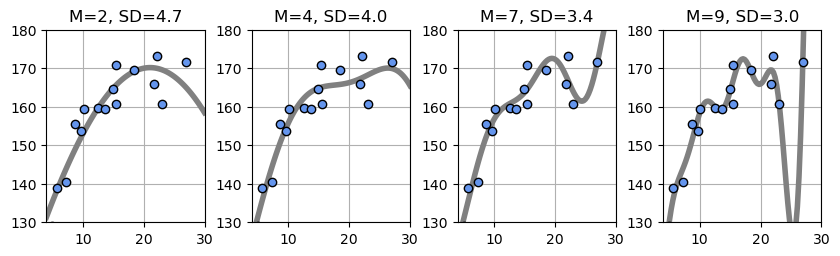

In [61]:
# List 5-2-8 

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(10, 2.5))
plt.subplots_adjust(wspace=0.3)
M = [2, 4, 7, 9]        # M = 2, 4, 7, 9의 선형 기저 함수 모델을 사용하여 피팅 시도
for i in range(len(M)):
    plt.subplot(1, len(M), i+1)
    W = fit_gauss_func(X, T, M[i])
    show_gauss_func(W)
    plt.plot(X, T, marker='o', linestyle='None', color = 'cornflowerblue', markeredgecolor = 'black')
    plt.xlim(X_min, X_max)
    plt.grid(True)
    plt.ylim(130, 180)
    mse = mse_gauss_func(X, T, W)

    plt.title("M={0:d}, SD={1:.1f}".format(M[i], np.sqrt(mse)))
plt.show()


- M이 7과 9가 되면 함수가 구부러짐

- 오차가 증가하는지 확인하려 SD를 보면, M이 증가함에 따라 제대로 줄어들고 있다.

![스크린샷 2024-07-10 17.27.26.png](<attachment:스크린샷 2024-07-10 17.27.26.png>)
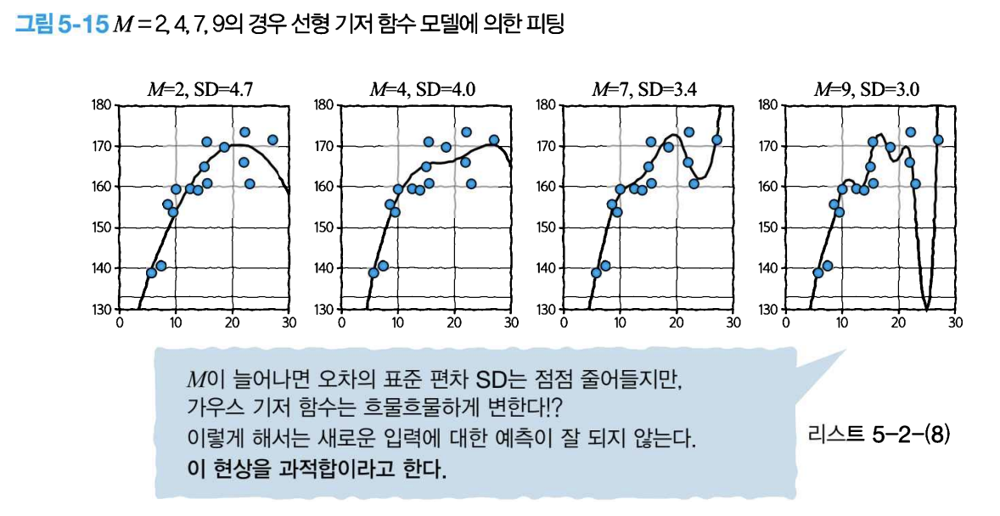

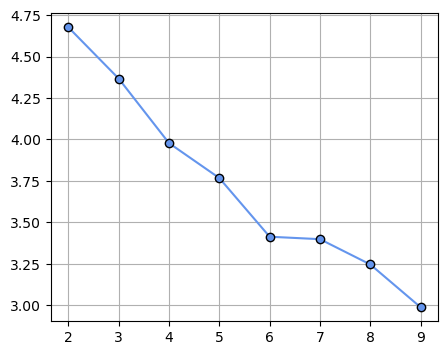

In [62]:
# List 5-2-9 

# M=2~9까지의 SD를 계산하고 플롯

plt.figure(figsize=(5,4))
M = range(2, 10)
mse2 = np.zeros(len(M))
for i in range(len(M)):
    W = fit_gauss_func(X, T, M[i])
    mse2[i] = np.sqrt(mse_gauss_func(X, T, W))
plt.plot(M, mse2, marker='o', color='cornflowerblue', markeredgecolor='black')
plt.grid(True)
plt.show()

- M이 증가함에 따라 SD가 점점 감소

![스크린샷 2024-07-10 17.32.31.png](<attachment:스크린샷 2024-07-10 17.32.31.png>)

- M이 증가할수록 선택 기저 함수 모델은 작은 국소로 표현할 수 있게 되므로 곡선은 데이터 점에 근접하게 되고, 오차(SD)는 점점 감소 

    - 이대로라면 성능이 나빠진다. 

    - 데이터 점의 오차는 작아져도, 새 데이터의 예측은 확실히 나빠짐 > 과적합(오버피팅, over-fitting)

- 최적의 M은 어떻게 찾는 법

    - 데이터 X와 T의 [4분의 1을 테스트 데이터] / [나머지 4분의 3을 훈련 데이터]로 나눔 
    
    - 모델 매개 변수 $w$는 훈련 데이터만을 사용하여 최적화
        
        - 훈련 데이터의 평균 제곱 오차를 최소화하도록 매개 변수 $w$를 선택
    
    - $w$를 사용하여 테스트 데이터의 평균 제곱 오차(또는 표준 편차 SD)를 계산, M의 평가 기준으로 한다.
    
        - 홀드아웃 검증 : 훈련에 이용하지 않은 미지의 데이터에 대한 예측 오차로 M을 평가 

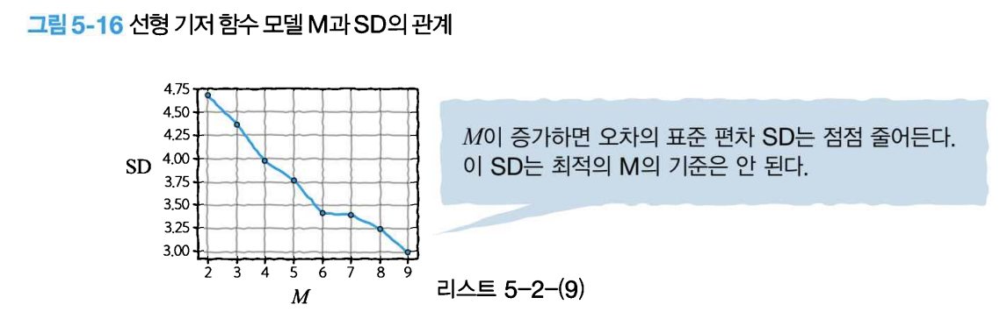

W=[29.4 75.7  2.9 98.3 54.9]
SD=3.98 cm


<function matplotlib.pyplot.show(close=None, block=None)>

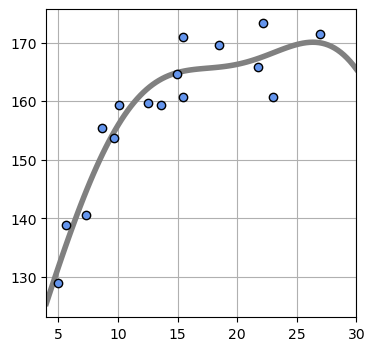

In [65]:
# List 5-2-4 

# [식 5-68]를 사용하여 최적의 매개 변수 w 찾기
# 선형 기저 함수 모델 gauss_func(w, x) 정의

# 선형 기저 함수 모델 ---
def gauss_func(w, x):
    m = len(w) - 1
    mu = np.linspace(5, 30, m)
    s = mu[1] - mu[0]
    y = np.zeros_like(x)        # x와 같은 크기로 요소가 0의 행렬 y를 작성
    for j in range(m):
        y = y + w[j] * gauss(x, mu[j], s)
    y = y + w[m]
    return y

# List 5-2-5

# 선형 기저 함수 모델 MSE ---
def mse_gauss_func(x, t, w):        # 평균 제곱 오차를 계산하는 함수 : 피팅의 수준을 산출
    y = gauss_func(w, x)            # mse_gauss_func(x, t, w)
    mse = np.mean((y - t) **2)
    return mse

# List 5-2-6

# 선형 기저 함수 모델의 정확한 해 ---
def fit_gauss_func(x, t, m):        # 선형 기저 함수 모형의 매개 변수의 해석해를 제공
    mu = np.linspace(5, 30, m)      # fit_gauss_func(x, t, m)
    s = mu[1] - mu[0]
    n = x.shape[0]
    psi = np.ones((n, m+1))
    for j in range(m):
        psi[:, j] = gauss(x, mu[j], s)
    psi_T = np.transpose(psi)

    b = np.linalg.inv(psi_T.dot(psi))
    c = b.dot(psi_T)
    w = c.dot(t)
    return w

# List 5-2-7

# 가우스 기저 함수 표시 ---
def show_gauss_func(w):
    xb = np.linspace(X_min, X_max, 100)
    y = gauss_func(w, xb)
    plt.plot(xb, y, c=[.5, .5, .5], lw=4)

# Main ---
plt.figure(figsize=(4,4))
M = 4
W = fit_gauss_func(X, T, M)
show_gauss_func(W)
plt.plot(X, T, marker='o', linestyle='None', color='cornflowerblue', markeredgecolor='black')
plt.xlim(X_min, X_max)
plt.grid(True)
mse = mse_gauss_func(X, T, W)
print('W=' + str(np.round(W,1)))
print("SD={0:.2f} cm".format(np.sqrt(mse)))
plt.show

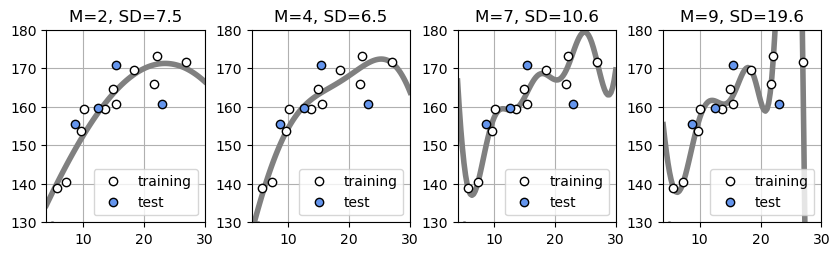

In [68]:
# List 5-2-10

# 훈련 데이터 / 테스트 데이터
X_test = X[:int(X_n / 4 + 1)]
T_test = T[:int(X_n / 4 + 1)]
X_train = X[int(X_n / 4 + 1):]
T_train = T[int(X_n / 4 + 1):]

# Main ---
plt.figure(figsize=(10, 2.5))

plt.subplots_adjust(wspace=0.3)
M = [2, 4, 7, 9]
for i in range(len(M)):
    plt.subplot(1, len(M), i + 1)
    W = fit_gauss_func(X_train, T_train, M[i])
    show_gauss_func(W)
    plt.plot(X_train, T_train, marker='o',
             linestyle='None', color='white',
             markeredgecolor='black', label='training')
    plt.plot(X_test, T_test, marker='o', linestyle='None',
             color='cornflowerblue',
             markeredgecolor='black', label='test')
    plt.legend(loc='lower right', fontsize=10, numpoints=1)
    plt.xlim(X_min, X_max)
    plt.ylim(130, 180)
    plt.grid(True)
    mse = mse_gauss_func(X_test, T_test, W)
    plt.title("M={0:d}, SD={1:.1f}".format(M[i], np.sqrt(mse)))
plt.show()

- M이 4, 7, 9로 증가함에 따라 곡선이 구부러져 훈련 데이터에 점점 접근

- But, fitting에 사용하지 않는 테스트 데이터(파란색)에서 벗어나는것 처럼 보임

![스크린샷 2024-07-10 20.07.54.png](<attachment:스크린샷 2024-07-10 20.07.54.png>)
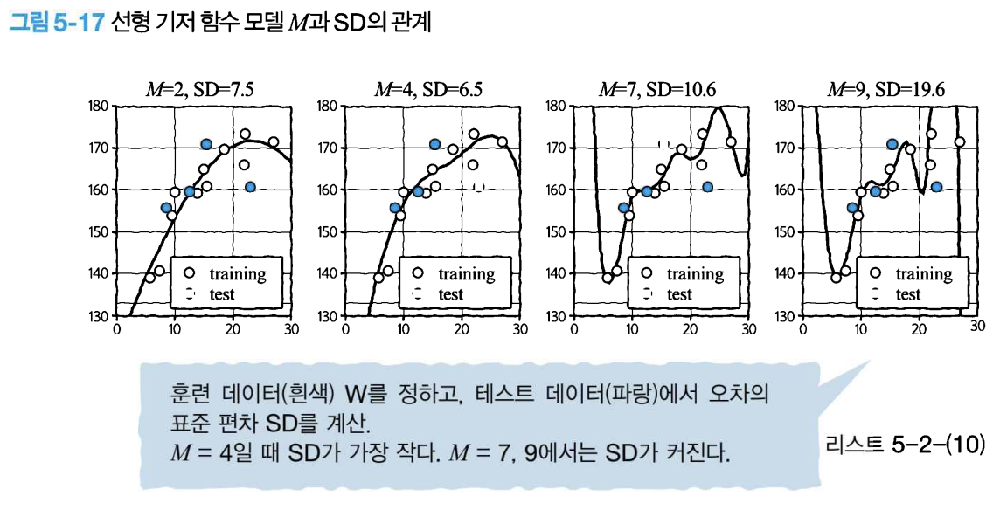

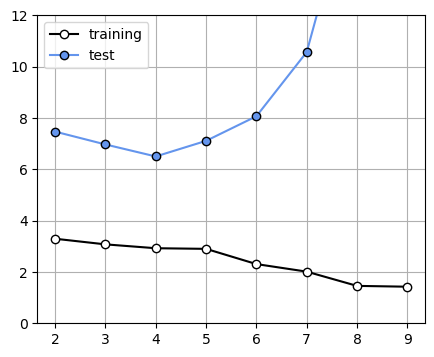

In [69]:
# List 5-2-11

# M을 2~9까지 하나씩 이동하여, 훈련 데이터와 테스트 데이터의 오차(SD)를 플롯
plt.figure(figsize=(5, 4))
M = range(2, 10)
mse_train = np.zeros(len(M))
mse_test = np.zeros(len(M))
for i in range(len(M)):
    W = fit_gauss_func(X_train, T_train, M[i])
    mse_train[i] = np.sqrt(mse_gauss_func(X_train, T_train, W))
    mse_test[i] = np.sqrt(mse_gauss_func(X_test, T_test, W))
plt.plot(M, mse_train, marker='o', linestyle='-', markerfacecolor='white', markeredgecolor='black', color='black', label='training')
plt.plot(M, mse_test, marker='o', linestyle='-', color='cornflowerblue', markeredgecolor='black', label='test')
plt.legend(loc='upper left', fontsize=10)
plt.ylim(0, 12)
plt.grid(True)
plt.show()

- "M=5에서 오버피팅이 일어난다"

- M=4의 경우가 가장 데이터에 적합하다.

![스크린샷 2024-07-10 20.36.37.png](<attachment:스크린샷 2024-07-10 20.36.37.png>)
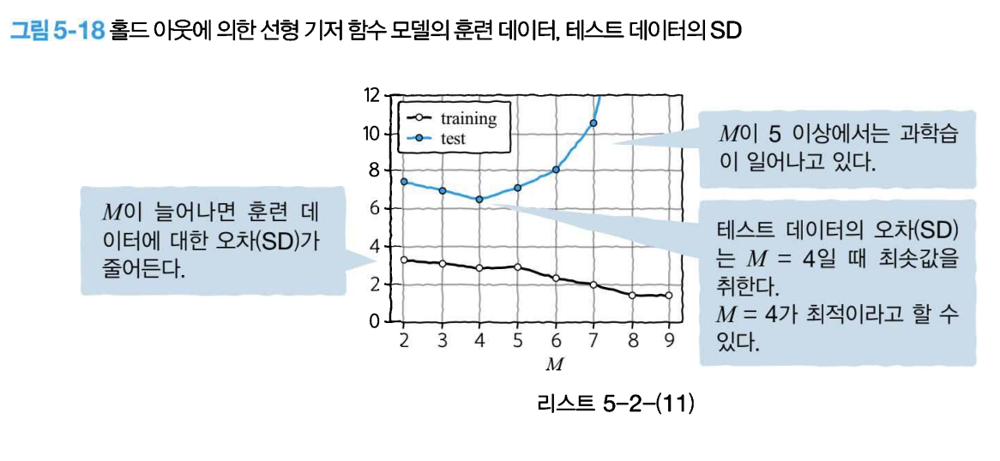

- 위 결과는 테스트 데이터에서 어떤 데이터 점을 선택하느냐에 의존

- [그림 5-17]에서 나오는 방법을 '분류법 A'로 하고, 다른 4개의 데이터 점을 테스트 데이터로 선택한 경우를 '분류법 B'로 피팅 한 모습을 [그림 5-19]에서 비교

- B는 A에 비해 SD(오차)가 많이 커짐 

    - 오차의 변동은 데이터 수가 충분하면 거의 없지만, 데이터 수가 적은 경우 두드러짐

![스크린샷 2024-07-10 20.44.22.png](<attachment:스크린샷 2024-07-10 20.44.22.png>)

- 차이를 줄이기 위해 "교차 검증(Cross-validation)" 사용 

    - 다양한 분할에서 오차를 내고 평균 계싼

    - 데이터 분할 종류 개수로 "K겹 교차 검증(K-hold Cross-validation)"로 부름

![스크린샷 2024-07-10 20.45.42.png](<attachment:스크린샷 2024-07-10 20.45.42.png>)
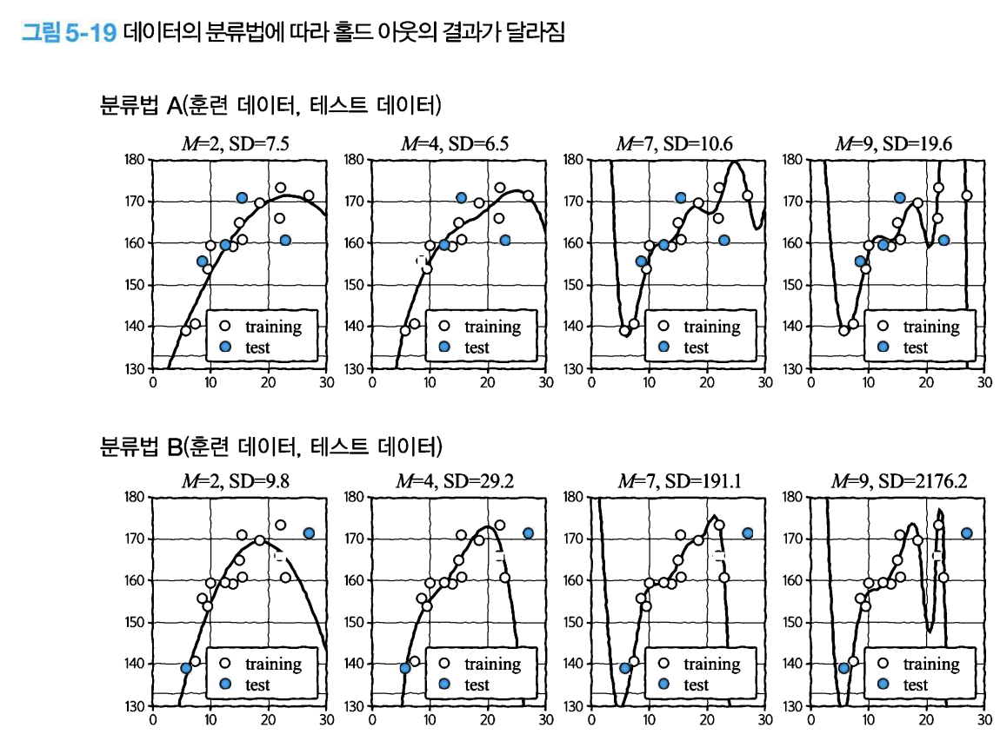
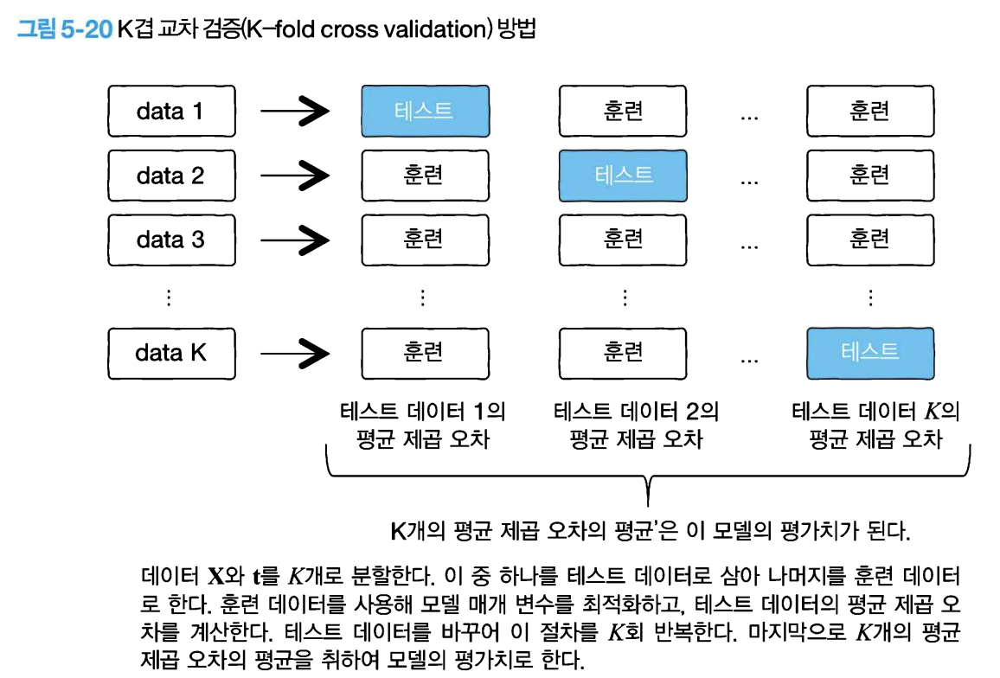

- 데이터 $X$와 $t$를 K개로 분할 > 첫번쩨 데이터 : 테스트 데이터 / 나머지 : 훈련 데이터

    - 훈련 데이터 : 모델 M의 매개 변수 구함 > 매개 변수 이용해서 테스트 데이터에서 MSE 계산

- K회 반복하고 마지막에 K개의 MSE의 평균을 계산하여 이 숫자를 M의 평가값으로 함

- 최대 분할 수 : $K=N$ / 테스트 데이터의 크기 = 1 > LOOCV(Leave-One-Out Cross-Validation) 

    - 데이터가 적은 경우 사용
    

In [78]:
# List 5-2-12

# K겹 교차 검증 ---
def kfold_gauss_func(x, t, m, k):       # 데이터를 K 분할하여 각각의 MSE를 출력하는 함수 
    n = x.shape[0]
    mse_train = np.zeros(k)
    mse_test = np.zeros(k)
    for i in range(0, k): 
        x_train = x[np.fmod(range(n), k) !=i]       # (A)
        t_train = t[np.fmod(range(n), k) !=i]       # (A)
        x_test = x[np.fmod(range(n), k) == i]       # (A)
        t_test = t[np.fmod(range(n), k) == i]       # (A)
        wm = fit_gauss_func(x_train, t_train, m)
        mse_train[i] = mse_gauss_func(x_train, t_train, wm)
        mse_test[i] = mse_gauss_func(x_test, t_test, wm)
        
    return mse_train, mse_test

# List 5-2-13

# (A)에서 사용되는 함수 np.fmod(n, k)는 n을 k로 나눈 나머지를 출력
# n을 range(n)로 부터 0~k-1 까지를 반복하는 n개의 리스트를 얻을 수 있다. 

np.fmod(range(10), 5)

array([0, 1, 2, 3, 4, 0, 1, 2, 3, 4])

In [79]:
# LIist 5-2-14

# kfold_gauss_func(x, t, m, k) 사용
# 기저의 수 M=4와 분할 수 K=4로 리스트 실행
M = 4
K = 4
kfold_gauss_func(X, T, M, K)

(array([12.87927851,  9.81768697, 17.2615696 , 12.92270498]),
 array([ 39.65348229, 734.70782016,  18.30921743,  47.52459642]))

- 위 : 각각의 분할에서 훈련 데이터의 MSE 

- 아래 : 테스트 데이터에서의 MSE


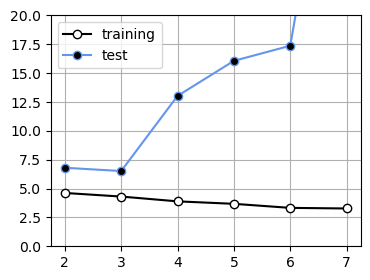

In [82]:
# List 5-2-15

# khold_gauss_function : 분할 수를 최대의 16으로 하고, 2에서 7까지의 M으로 오차의 평균을 계산하여 플롯
M = range(2, 8)
K = 16
Cv_Gauss_train = np.zeros((K,len(M)))
Cv_Gauss_test = np.zeros((K,len(M)))
for i in range(0, len(M)):
    Cv_Gauss_train[:, i], Cv_Gauss_test[:, i] =\
                kfold_gauss_func(X, T, M[i], K)
mean_Gauss_train = np.sqrt(np.mean(Cv_Gauss_train, axis=0))
mean_Gauss_test = np.sqrt(np.mean(Cv_Gauss_test, axis=0))

plt.figure(figsize=(4, 3))
plt.plot(M, mean_Gauss_train, marker='o', linestyle='-', color='k', markerfacecolor='w', label ='training')
plt.plot(M, mean_Gauss_test, marker='o', linestyle='-', color='cornflowerblue', markerfacecolor='black', label ='test')
plt.legend(loc = 'upper left', fontsize=10)
plt.ylim(0, 20)
plt.grid(True)
plt.show()

- M=3 : 오차가 Min > LOOCV에서는 M=3이 가장 적합하다.

![스크린샷 2024-07-10 21.13.47.png](<attachment:스크린샷 2024-07-10 21.13.47.png>)
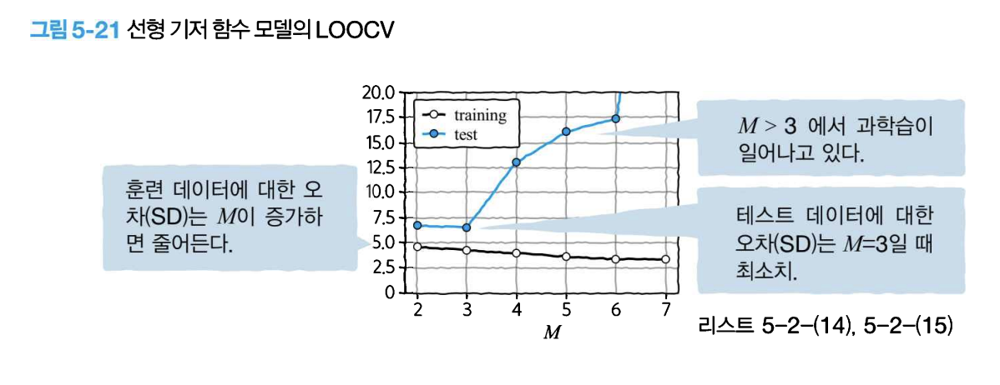

- 교차 검증

    - M을 구하기 위한 방법 (O)

    - 모델 매개 변수 w를 구하는 용도 (X)
    

SD = 4.37cm


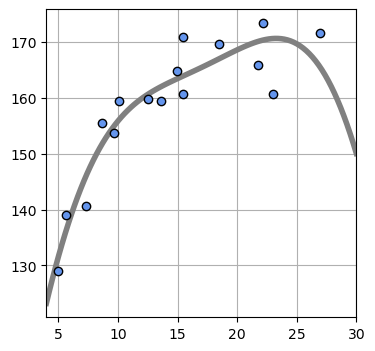

In [85]:
# List 5-2-16

# 매개 변수 w를 사용한 곡선으로, 미지의 입럭 데이터 x에 대한 예측 y를 출력
M =3 
plt.figure(figsize=(4,4))
W = fit_gauss_func(X, T, M)
show_gauss_func(W)
plt.plot(X, T, marker='o', linestyle='None', color='cornflowerblue', markeredgecolor='black')
plt.xlim([X_min, X_max])
plt.grid(True)
mse = mse_gauss_func(X, T, W)
print("SD = {0:.2f}cm".format(np.sqrt(mse)))
plt.show()


- 이번 테스트 데이터(N=16)처럼 데이터 수가 적은 경우 : 교차 검증이 유용

    - 데이터 수가 많으면 교차 검증은 계산에 시간이 많이 걸림 > 홀드 아웃 검증 사용

    - 데이터 수가 크면 홀드 아웃 검증 결과와 교차 검증과 비슷

![스크린샷 2024-07-10 21.21.40.png](<attachment:스크린샷 2024-07-10 21.21.40.png>)
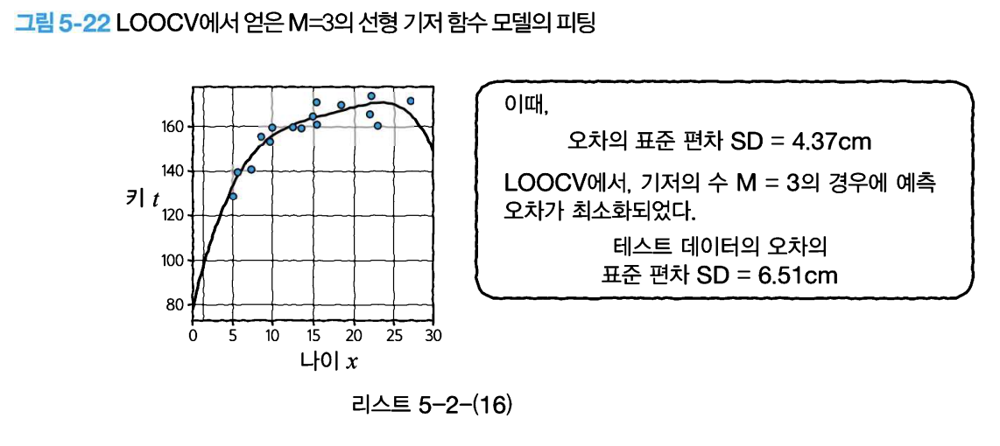

## 5.6 새로운 모델의 생성

- 데이터가 충분하지 않아 모델에 문제가 발생 > 부족한 부분의 지식에 해당하는 모델 만듦

$$y(x) = w_o -w_1 exp(-w_2x)$$

- $ w_0 , w_1, w_2$ : 양의 값을 취하는 매개 변수 : 모델 A

    - $x$가 증가하면 $exp(-w_2 x ) : 0에 접근 > 1항의 $w_0$만 값을 가짐

    - $x$가 증가하면 $y$는 $w_0$에 가까워짐 

    - $w_0$ : 수렴하는 값을 결정하는 매개 변수

    - $w_1$ : 그래프의 시작점을 결정하는 매개 변수

    - $w_2$ : 그래프의 기울기를 결정하는 매개 변수

    ![스크린샷 2024-07-10 21.26.58.png](<attachment:스크린샷 2024-07-10 21.26.58.png>)
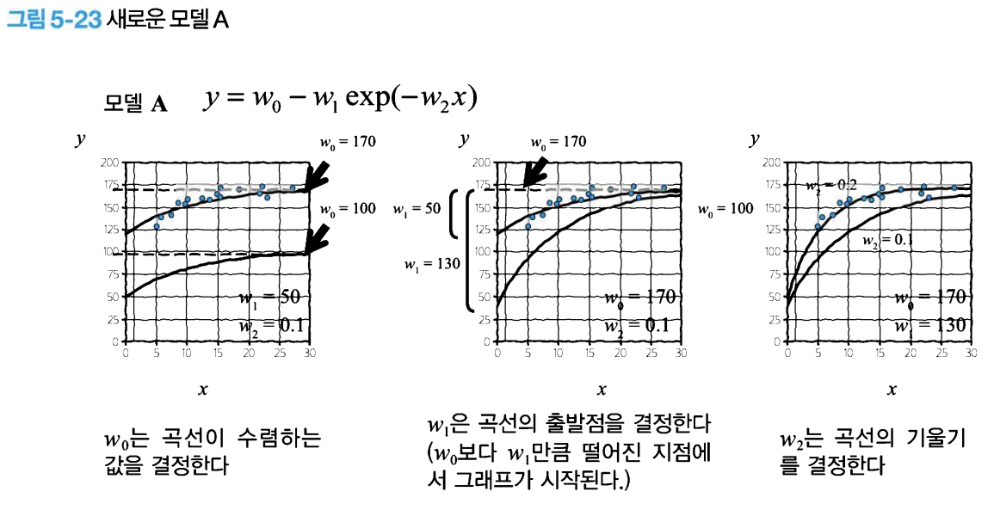

- 데이터에 맞는 $w_0, w_1, w_2$ 구함

- $J$가 최소가 되도록 선택

    $$ J = \frac{1}{N} \displaystyle \sum_{n=0}^{N-1} (y_n -t_n)^2

    

- 최적화 문제 : 함수의 최댓값 또는 최솟값 구하는 문제

- scipy.optimize에 포함된 minimize 함수를 사용하여 최적 매개 변수 구함

    - 이 함수는 최솟값을 구하는 함수와 매개 변수의 초기 값만 주면, 함수의 미분을 주지 않아도 매개 변수의 극솟값을 출력

In [5]:
# List 5-2-17

# 모델 A ---
def model_A(x,w):
    y = w[0] - w[1] * np.exp(-w[2] * x)
    return y

# 모델 A 표시 ---
def show_model_A(w):
    xb = np.linspace(X_min, X_max, 100)
    y = model_A(xb, w)
    plt.plot(xb, y, c=[.5, .5, .5], lw=4)
    
# 모델 A의 MSE ---
def mse_model_A(w, x, t):
    y = model_A(x, w)
    mse = np.mean((y-t)**2)
    return mse

# List 5-2-18

from scipy.optimize import minimize

# 모델 A의 매개 변수 최적화 ---
def fit_model_A(w_init, x, t):
    res1 = minimize(mse_model_A, w_init, args=(x, t), method="powell")
    return res1.x

- 첫째 줄 : scipy.optimize 최적화 라이브러리의 minimize 호출 

    - 최적화 함수 fit_model_A(w_init, x, t)의 인수에는 반복 연산을 위한 매개 변수의 초기값 w_init, 입력 데이터 x, 목표 데이터 t가 들어간다.

- res1 = minimize(mse_model_A, w_init, args=(x, t), method="powell")

    - mse_model_A(w, x, t)를 부분적으로 최소화하는 w 계산

    - 첫 번째 인수 : 최소화할 목표 함수
    
    - 두 번째 인수 : $w$의 초기값

    - 세 번째 인수 : 목표 함수 mse_model_A(w, x, t)를 최적화하는 매개 변수 w 이외의 인수인 x, t

In [ ]:
# 리스트 5-2-19

# Main ---
plt.figure(figsize=(4, 4))
W_init=[100, 0, 0]
W = fit_model_A(W_init, X, T)
print("w0={0:.1f}, w1={1:.1f}, w2={2:.1f}".format(W[0], W[1], W[2]))
show_model_A(W)
plt.plot(X, T, marker='o', linestyle='None',
         color='cornflowerblue',markeredgecolor='black')
plt.xlim(X_min, X_max)
plt.grid(True)
mse = mse_model_A(W, X, T)
print("SD={0:.2f} cm".format(np.sqrt(mse)))
plt.show()

![스크린샷 2024-07-10 22.51.09.png](<attachment:스크린샷 2024-07-10 22.51.09.png>)
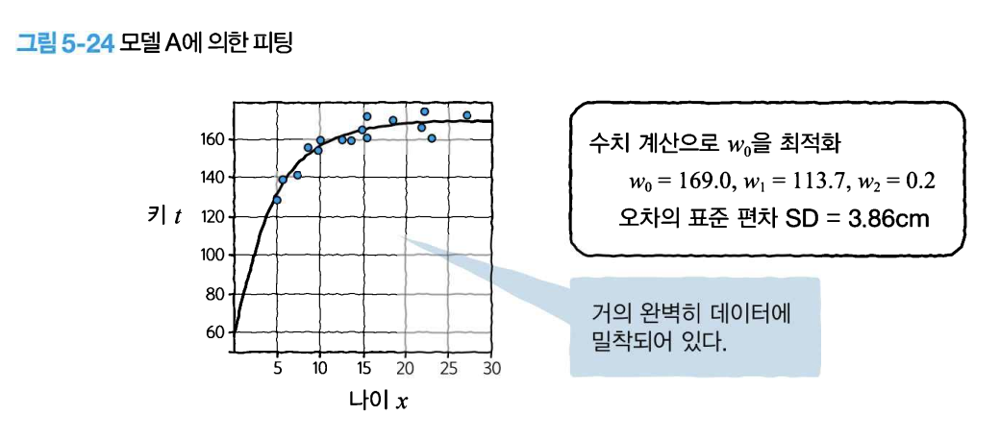

## 5.7 모델의 선택

In [ ]:
# List 5-2-20

# 모델 A의 LOOCV를 실시 > [그림 5-21]의 선형 기저 함수의 모델과 비교
def kfold_model_A(x, t, k):
    n = len(x)
    mse_train = np.zeros(k)
    mse_test = np.zeros(k)
    for i in range(0, k):
        x_train = x[np.fmod(range(n), k) !=i]
        t_train = t[np.fmod(range(n), k) !=i]
        x_test = x[np.fmod(range(n), k) == i]
        t_test = t[np.fmod(range(n), k) == i]
        wm = fit_model_A(np.array([169, 113, 0.2], x_train, t_train))
        mse_train[i] = mse_model_A(wm, x_train, t_train)
        mse_test[i] = mse_model_A(wm, x_test, t_test)
    return mse_train, mse_test

# Main ---
K = 16
Cv_A_train, Cv_A_test = kfold_model_A(X, T, K)
mean_A_test = np.sqrt(np.mean(Cv_A_test))
print("Gauss(M=3) SD={0:.2f} cm".format(mean_Gauss_test[1]))
print("Model A SD={0:.2f} cm".format(mean_A_test))
SD = np.append(mean_Gauss_test[0:5], mean_A_test)
M = range(6)
label = ["M=2", "M=3", "M=4", "M=5", "M=6", "Model A"]

plt.figure(figsize=(5, 3))
plt.bar(M, SD, tick_label=label, align="center", facecolor="cornflowerblue")
plt.show()